In [2]:
import pandas as pd

# Load the Excel file
file_path = "/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx"

# Read all sheet names to understand the structure
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names

sheet_names


['Main']

In [3]:
# Load the 'Main' sheet
df = xls.parse('Main')

# Show the first few rows to understand the structure
df.head()


,ID,COUNTRY,AFR ADMIN2 Code,AFR Admin name,AREA_TYPE,Lat,Long,MM,YY,LoAge,UpAge,Ex,Pf,PfPR2-10,METHOD
0,396,Angola,AGO015,Bengo,Point,-7.859672,13.137999,6,1941,2.0,9.0,50.0,14.0,28.000000,Microscopy
1,397,Angola,AGO015,Bengo,Point,-8.238753,13.468226,8,2009,1.0,14.0,71.0,38.0,55.127685,RDT
2,398,Angola,AGO015,Bengo,Point,-8.579000,13.662000,11,2006,0.6,5.0,22.0,2.0,9.452063,RDT
3,399,Angola,AGO015,Bengo,Point,-8.751143,13.909834,8,2009,1.0,14.0,37.0,4.0,11.134721,RDT
4,400,Angola,AGO015,Bengo,Point,-8.494129,13.822159,8,2009,1.0,14.0,24.0,5.0,21.455712,RDT


In [4]:
# Choose a country with sufficient data points; let's see the most frequent ones
country_counts = df['COUNTRY'].value_counts()
country_counts.head(10)


COUNTRY
Kenya                               5713
Tanzania                            4334
Sudan                               3893
Namibia                             3139
Somalia                             2437
Ethiopia                            2216
Democratic Republic of the Congo    2130
Uganda                              1906
Mozambique                          1838
Nigeria                             1600
Name: count, dtype: int64

In [5]:
# Filter data for Kenya
kenya_df = df[df['COUNTRY'] == 'Kenya']

# Drop rows where PfPR2-10 is NaN
kenya_df = kenya_df.dropna(subset=['PfPR2-10'])

# Create a datetime column from Year and Month
kenya_df['Date'] = pd.to_datetime(kenya_df[['YY', 'MM']].rename(columns={'YY': 'year', 'MM': 'month'}).assign(day=1))

# Group by Date and compute mean prevalence
time_series = kenya_df.groupby('Date')['PfPR2-10'].mean().sort_index()

# Display the first few rows of the time series
time_series.head()


Date
1927-03-01    81.448468
1927-08-01    51.399288
1927-10-01    54.568875
1927-12-01     1.194467
1928-01-01    60.971822
Name: PfPR2-10, dtype: float64

In [6]:
import pandas as pd

# Load your Excel file
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name="Main")

# Filter for Kenya and drop missing values
kenya_df = df[df["COUNTRY"] == "Kenya"].dropna(subset=["PfPR2-10"])

# Combine year and month into a datetime
kenya_df["Date"] = pd.to_datetime(dict(year=kenya_df["YY"], month=kenya_df["MM"], day=1))

# Group by month and average the malaria prevalence
time_series = kenya_df.groupby("Date")["PfPR2-10"].mean().sort_index()


In [10]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data.reshape(-1, 1))

X, y = create_sequences(scaled_data, sequence_length)


In [15]:
import numpy as np

def create_sequences(data, seq_len):
    X, y = [], []
    for i in range(len(data) - seq_len):
        X.append(data[i:i+seq_len])
        y.append(data[i+seq_len])
    return np.array(X), np.array(y)

sequence_length = 26  # e.g., 12 months
data = time_series.values
X, y = create_sequences(data, sequence_length)


# simple transformer based approach( LSTM and GRU)

In [41]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, losses
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# --------------------
# 1. Load and Preprocess Data
# --------------------
# Read your Excel file
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)

# Pick a numeric column for time series modeling (you can change this)
target_col = df.select_dtypes(include=np.number).columns[0]
series = df[target_col].dropna().values

# Normalize
scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series.reshape(-1, 1)).flatten()

# --------------------
# 2. Prepare Sequences
# --------------------
def create_sequences(data, seq_length):
    X,y = df[['LoAge', 'UpAge', 'Ex', 'Pf'] ['PfPR2-10']]
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)
    
SEQ_LEN = 26
X, y = create_sequences(series_scaled, SEQ_LEN)

# Reshape to (samples, sequence_length, features)
X = X.reshape(-1, SEQ_LEN, 1)

# Train-Test Split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# --------------------
# 3. Transformer Model
# --------------------
def build_transformer_model(sequence_length, d_model=64, num_heads=2, ff_dim=64):
    inputs = layers.Input(shape=(sequence_length, 1))
    
    # Project input to d_model dimensions
    x = layers.Dense(d_model)(inputs)
    
    # Positional Encoding (optional)
    positions = tf.range(start=0, limit=sequence_length, delta=1)
    pos_encoding = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(positions)
    x += pos_encoding

    # Multi-Head Attention + Layer Norm
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Feed-forward Network
    ffn = models.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(x)
    x = layers.Add()([x, ffn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Output Layer
    x = layers.GlobalAveragePooling1D()(x)
    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer="adam", loss="mse", metrics=["mae"])
    return model

# --------------------
# 4. Train the Model
# --------------------
model = build_transformer_model(sequence_length=SEQ_LEN, d_model=128, num_heads=4, ff_dim=128)

model.summary()
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=200,
    batch_size=32,
    verbose=1
)
# --------------------
# 5. Evaluate
# --------------------
loss, mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f} - MAE: {mae:.4f}")


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 26, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 26, 128)        │            256 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_8 (Add)               │ (None, 26, 128)        │              0 │ dense_15[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_4    │ (None, 26, 128)        │        263,808 │ add_8[0][0],           │
│ (MultiHeadAttention)      │                        │                │ add_8[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 26, 128)        │              0 │ add_8[0][0],           │
│                           │                        │                │ multi_head_attention_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_7     │ (None, 26, 128)        │            256 │ add_9[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, 26, 128)        │         33,024 │ layer_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, 26, 128)        │              0 │ layer_normalization_7… │
│                           │                        │                │ sequential_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_8     │ (None, 26, 128)        │            256 │ add_10[0][0]           │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling1d… │ (None, 128)            │              0 │ layer_normalization_8… │
│ (GlobalAveragePooling1D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_18 (Dense)          │ (None, 1)              │            129 │ global_average_poolin… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 297,729 (1.14 MB)

 Trainable params: 297,729 (1.14 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.1414 - mae: 0.1149 - val_loss: 0.0012 - val_mae: 0.0326
Epoch 2/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 6.1119e-05 - mae: 0.0052 - val_loss: 9.5416e-04 - val_mae: 0.0293
Epoch 3/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 2.4570e-04 - mae: 0.0110 - val_loss: 2.5126e-04 - val_mae: 0.0130
Epoch 4/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 4.2278e-04 - mae: 0.0123 - val_loss: 0.0094 - val_mae: 0.0965
Epoch 5/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 3.2444e-04 - mae: 0.0104 - val_loss: 8.1398e-05 - val_mae: 0.0071
Epoch 6/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 2.9764e-04 - mae: 0.0087 - val_loss: 3.2253e-05 - val_mae: 0.0047
Epoch 7/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.4337e-04 - mae: 0.0082 - val_loss: 1.8776e-04 - val_mae: 0.0128
Epoch 8/200
1260/1260 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.0172e-04 - mae: 0.0059 - val_loss: 4.9637e-

158/158 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


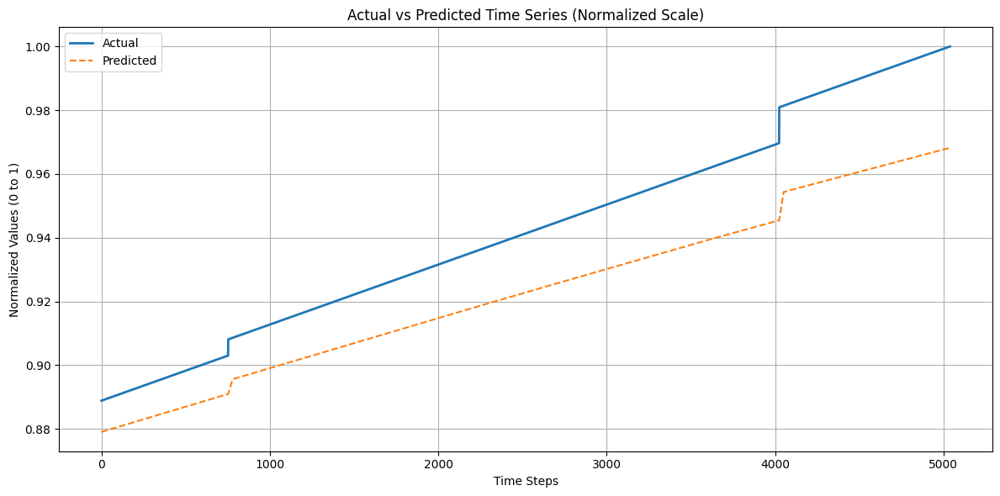

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Predict using the model
y_pred = model.predict(X_test)

# 2. Reshape if needed (usually y_pred is shape (samples, 1))
# y_pred = y_pred.reshape(-1)
# y_test = y_test.reshape(-1)

# 3. Plot predicted vs actual values (normalized scale)
plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual', linewidth=2)
plt.plot(y_pred, label='Predicted', linestyle='dashed')
plt.title('Actual vs Predicted Time Series (Normalized Scale)')
plt.xlabel('Time Steps')
plt.ylabel('Normalized Values (0 to 1)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


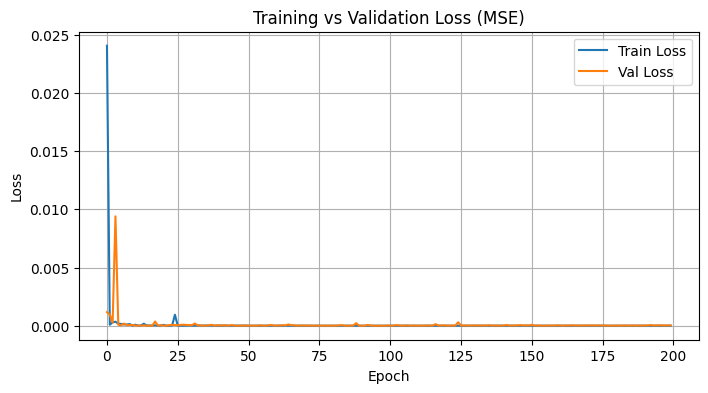

In [44]:
# Plot training and validation loss
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Training vs Validation Loss (MSE)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


2025-05-27 21:10:43.560677: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748380243.846945      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748380243.943432      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
I0000 00:00:1748380264.890655      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13852 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748380264.891326      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability:

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
Angola                    | Test Loss: 0.0384, MAE: 0.1389


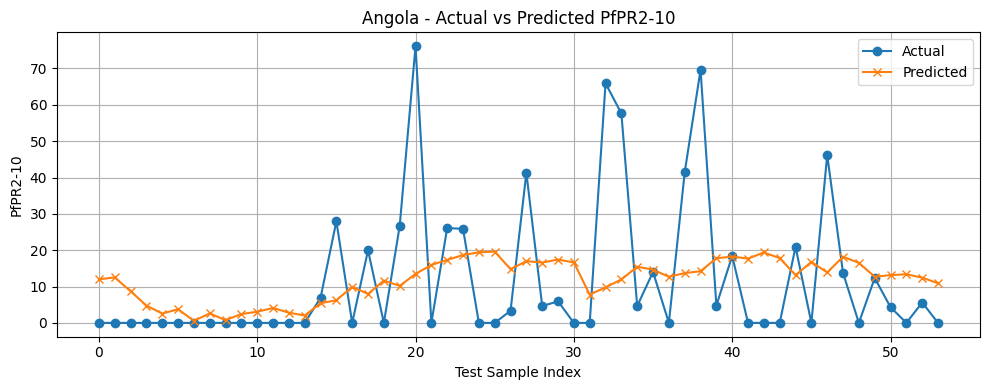

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step
Benin                     | Test Loss: 0.0760, MAE: 0.2138


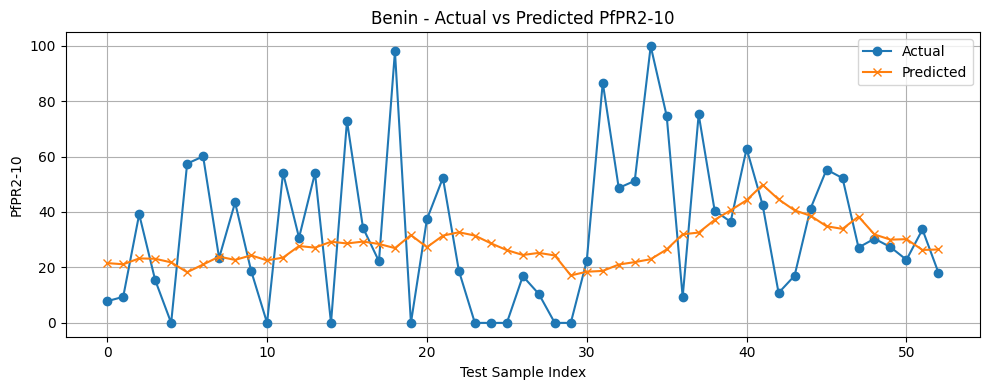

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
Botswana                  | Test Loss: 0.0058, MAE: 0.0636


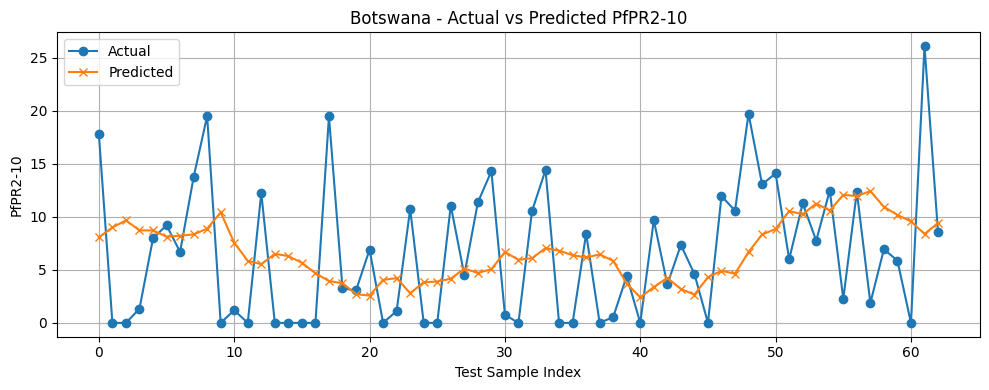

KeyboardInterrupt: 

In [13]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# --------------------
# 1. Load Data
# --------------------
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)

# Select relevant columns and drop rows with missing values in these columns
df = df[['COUNTRY', 'YY', 'PfPR2-10', 'LoAge', 'UpAge', 'Ex', 'Pf']].dropna()

# --------------------
# 2. Helper Functions
# --------------------
def create_multivariate_sequences(data, seq_length, target_col_index):
    """
    data: numpy array of shape (num_samples, num_features)
    seq_length: length of the input sequence
    target_col_index: column index of target feature (PfPR2-10)
    """
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length, target_col_index])  # target value at next timestep
    return np.array(X), np.array(y)

def build_transformer_model(sequence_length, feature_dim, d_model=32, num_heads=2, ff_dim=64, dropout_rate=0.2):
    inputs = layers.Input(shape=(sequence_length, feature_dim))
    x = layers.Dense(d_model)(inputs)

    # Positional Embedding
    positions = tf.range(start=0, limit=sequence_length, delta=1)
    pos_encoding = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(positions)
    pos_encoding = tf.expand_dims(pos_encoding, axis=0)
    x = x + pos_encoding

    # Multi-head Attention
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model, dropout=dropout_rate)(x, x)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Feedforward network
    ffn = models.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dropout(dropout_rate),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(x)
    x = layers.Add()([x, ffn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer="adam", loss="mse", metrics=["mae"])
    return model

# --------------------
# 3. Loop through countries
# --------------------
SEQ_LEN = 10
results = []

countries = df['COUNTRY'].unique()

for country in countries:
    df_country = df[df['COUNTRY'] == country].sort_values(by='YY')

    # Extract values for features and target
    features = df_country[['LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']].values

    if len(features) <= SEQ_LEN + 5:
        continue

    # Normalize features column-wise
    scalers = {}
    features_scaled = np.zeros_like(features)
    for i in range(features.shape[1]):
        scaler = MinMaxScaler()
        features_scaled[:, i] = scaler.fit_transform(features[:, i].reshape(-1, 1)).flatten()
        scalers[i] = scaler

    # Create sequences (target_col_index = last column = 4)
    X, y = create_multivariate_sequences(features_scaled, SEQ_LEN, target_col_index=4)

    # Split into train/val/test sets (time-series split, no shuffling)
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    # Build model with feature dimension = 5 (LoAge, UpAge, Ex, Pf, PfPR2-10)
    model = build_transformer_model(SEQ_LEN, feature_dim=5, d_model=32, num_heads=2, ff_dim=64, dropout_rate=0.2)

    # Callbacks
    es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    mc_path = f"{country}_best_model.keras"
    mc = ModelCheckpoint(mc_path, monitor='val_loss', save_best_only=True)

    # Train
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=16,
        callbacks=[es, mc],
        verbose=0
    )

    # Evaluate
    loss, mae = model.evaluate(X_test, y_test, verbose=0)

    # Predict
    y_pred = model.predict(X_test)

    # Inverse scale predictions and true values (using PfPR2-10 scaler, i=4)
    y_pred_rescaled = scalers[4].inverse_transform(y_pred)
    y_test_rescaled = scalers[4].inverse_transform(y_test.reshape(-1, 1))

    results.append((country, loss, mae))
    print(f"{country:25s} | Test Loss: {loss:.4f}, MAE: {mae:.4f}")

    # Plot Prediction
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_rescaled, label="Actual", marker='o')
    plt.plot(y_pred_rescaled, label="Predicted", marker='x')
    plt.title(f"{country} - Actual vs Predicted PfPR2-10")
    plt.xlabel("Test Sample Index")
    plt.ylabel("PfPR2-10")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------
# 4. Summary
# --------------------
results_df = pd.DataFrame(results, columns=['COUNTRY', 'Loss', 'MAE'])
print("\n--- Summary of Top 10 Regions by MAE ---")
print(results_df.sort_values(by='MAE').head(10))


In [23]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import os

# --------------------
# 1. Load Data
# --------------------
df = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")

# Confirm columns
expected_cols = ['COUNTRY', 'UpAge', 'Ex', 'Pf', 'PfPR2-10', 'METHOD']
if not all(col in df.columns for col in expected_cols):
    raise ValueError(f"Missing columns. Found: {df.columns.tolist()}")

# Encode METHOD (RDT/Microscopy)
df['METHOD'] = LabelEncoder().fit_transform(df['METHOD'])

# Check available countries
countries = df['COUNTRY'].unique()
print(f"Found {len(countries)} countries.")

# Results storage
results = []

# --------------------
# 2. Sequence Creator
# --------------------
SEQ_LEN = 10

def create_sequences(features, targets, seq_length):
    X, y = [], []
    for i in range(len(features) - seq_length):
        X.append(features[i:i + seq_length])
        y.append(targets[i + seq_length])
    return np.array(X), np.array(y)

# --------------------
# 3. Transformer Builder
# --------------------
def build_transformer_model(sequence_length, feature_dim, d_model=32, num_heads=2, ff_dim=64, dropout_rate=0.2):
    inputs = layers.Input(shape=(sequence_length, feature_dim))
    x = layers.Dense(d_model)(inputs)

    positions = tf.range(start=0, limit=sequence_length, delta=1)
    pos_encoding = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(positions)
    pos_encoding = tf.expand_dims(pos_encoding, axis=0)
    x = x + pos_encoding

    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    ffn = models.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dropout(dropout_rate),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(x)
    x = layers.Add()([x, ffn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer="adam", loss="mse", metrics=["mae"])
    return model

# --------------------
# 4. Loop Over Countries
# --------------------
for country in countries:
    df_country = df[df['COUNTRY'] == country].dropna()

    if len(df_country) < SEQ_LEN + 5:
        print(f"Skipping {country} (not enough data)")
        continue

    print(f"\nProcessing {country}...")

    features = df_country[['UpAge', 'Ex', 'Pf', 'METHOD']].values
    target_2 = df_country['PfPR2-10'].values  # Target for PfPR2-10

    # Normalize
    scaler_X = MinMaxScaler()
    scaler_y_2 = MinMaxScaler()
    
    features_scaled = scaler_X.fit_transform(features)
    target_scaled_2 = scaler_y_2.fit_transform(target_2.reshape(-1, 1)).flatten()

    # Create sequences
    X, y_2 = create_sequences(features_scaled, target_scaled_2, SEQ_LEN)
    
    if len(X) == 0:
        print(f"Skipping {country} (not enough sequences)")
        continue

    # Train/test split
    X_train, X_temp, y_train_2, y_temp_2 = train_test_split(X, y_2, test_size=0.2, shuffle=False)
    X_val, X_test, y_val_2, y_test_2 = train_test_split(X_temp, y_temp_2, test_size=0.5, shuffle=False)

    # Build model
    model = build_transformer_model(sequence_length=SEQ_LEN, feature_dim=X.shape[2])

    # Train
    es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    mc_path = f"{country}_best_model.keras"
    mc = ModelCheckpoint(mc_path, monitor='val_loss', save_best_only=True)

    history = model.fit(
        X_train, y_train_2,
        validation_data=(X_val, y_val_2),
        epochs=100,
        batch_size=16,
        callbacks=[es, mc],
        verbose=0
    )

    # Evaluate
    loss_2, mae_2 = model.evaluate(X_test, y_test_2, verbose=0)

    # Predict
    y_pred_2 = model.predict(X_test)
    y_pred_rescaled_2 = scaler_y_2.inverse_transform(y_pred_2)
    y_test_rescaled_2 = scaler_y_2.inverse_transform(y_test_2.reshape(-1, 1))

    results.append((country, loss_2, mae_2))
    print(f"{country:25s} | Test Loss: {loss_2:.4f}, MAE: {mae_2:.4f}")

    # Plot for PfPR2-10
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_rescaled_2, label="Actual", marker='o')
    plt.plot(y_pred_rescaled_2, label="Predicted", marker='x')
    plt.title(f"{country} - Actual vs Predicted PfPR2-10")
    plt.xlabel("Test Sample Index")
    plt.ylabel("PfPR2-10")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"{country}_PfPR2_10_prediction_plot.png")
    plt.close()

# --------------------
# 5. Summary
# --------------------
results_df = pd.DataFrame(results, columns=['COUNTRY', 'Loss', 'MAE'])
print("\n--- Summary of Top 10 Countries by MAE ---")
print(results_df.sort_values(by='MAE').head(10))


Found 43 countries.

Processing Angola...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 463ms/step
Angola                    | Test Loss: 0.0897, MAE: 0.2570

Processing Benin...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 461ms/step
Benin                     | Test Loss: 0.0773, MAE: 0.2270

Processing Botswana...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 462ms/step
Botswana                  | Test Loss: 0.0208, MAE: 0.1294

Processing Burkina Faso...
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step
Burkina Faso              | Test Loss: 0.0826, MAE: 0.2484

Processing Burundi...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
Burundi                   | Test Loss: 0.0867, MAE: 0.2281

Processing Cameroon...
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step
Cameroon                  | Test Loss: 0.0718, MAE: 0.2205

Processing Central African Republic...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
Central African Republic  | Test Loss: 0.1086, MAE: 0.2841

Processing Chad...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
Chad                      | Test Loss: 0.0985, MAE: 0

InternalError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "/tmp/ipykernel_35/1694681352.py", line 117, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

ptxas exited with non-zero error code 2, output: : If the error message indicates that a file could not be written, please verify that sufficient filesystem space is provided.
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_multi_step_on_iterator_1008077]

# transformer based appraoch with early stopping to prevent overfitting

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
Angola                    | Test MAE: 14.65


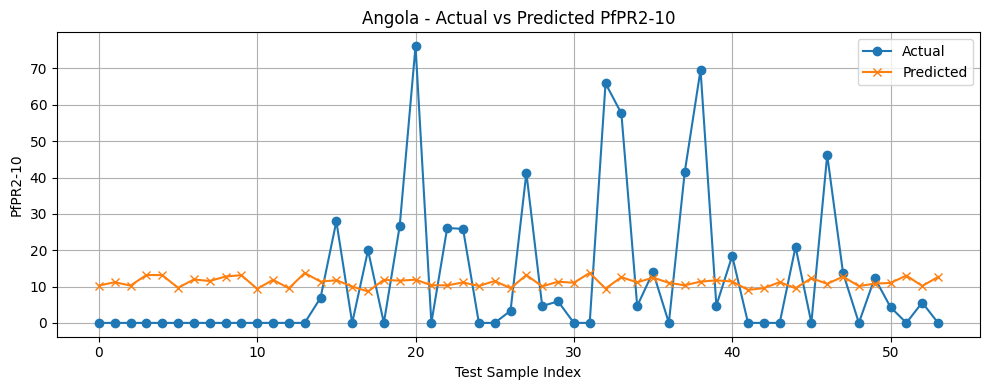

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
Benin                     | Test MAE: 22.02


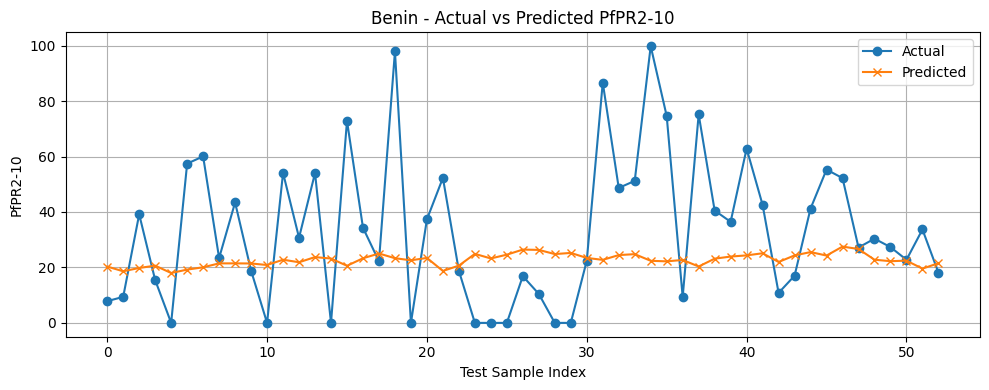

KeyboardInterrupt: 

In [17]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# --------------------
# 1. Load Data
# --------------------
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)
df = df[['COUNTRY', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']].dropna()

# Normalize PfPR2-10 to [0,1]
df['PfPR2-10'] = df['PfPR2-10'] / 100.0

# --------------------
# 2. Helper Functions
# --------------------
def create_sequences(data, target, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

def build_transformer_model(sequence_length, num_features, d_model=64, num_heads=4, ff_dim=128, dropout_rate=0.3):
    inputs = layers.Input(shape=(sequence_length, num_features))
    x = layers.Dense(d_model)(inputs)

    # Positional Encoding
    positions = tf.range(start=0, limit=sequence_length, delta=1)
    pos_encoding = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(positions)
    pos_encoding = tf.expand_dims(pos_encoding, axis=0)
    x = x + pos_encoding

    # Transformer Block
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model, dropout=dropout_rate)(x, x)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    ffn = models.Sequential([
        layers.Dense(ff_dim, activation="relu"),
        layers.Dropout(dropout_rate),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(x)
    x = layers.Add()([x, ffn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer="adam", loss="mse", metrics=["mae"])
    return model

# --------------------
# 3. Loop through countries
# --------------------
SEQ_LEN = 10
results = []
features = ['LoAge', 'UpAge', 'Ex', 'Pf']
countries = df['COUNTRY'].unique()

for country in countries:
    df_country = df[df['COUNTRY'] == country].sort_values(by='YY')

    X_values = df_country[features].values
    y_values = df_country['PfPR2-10'].values.reshape(-1, 1)

    if len(y_values) <= SEQ_LEN + 5:
        continue

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_scaled = scaler_X.fit_transform(X_values)
    y_scaled = scaler_y.fit_transform(y_values)

    X_seq, y_seq = create_sequences(X_scaled, y_scaled, SEQ_LEN)

    # Split into train/val/test
    X_train, X_temp, y_train, y_temp = train_test_split(X_seq, y_seq, test_size=0.2, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    model = build_transformer_model(SEQ_LEN, num_features=len(features))

    es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    mc_path = f"{country}_best_model.keras"
    mc = ModelCheckpoint(mc_path, monitor='val_loss', save_best_only=True)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=16,
        callbacks=[es, mc],
        verbose=0
    )

    loss, mae = model.evaluate(X_test, y_test, verbose=0)

    # Inverse scale predictions
    y_pred = model.predict(X_test)
    y_pred_rescaled = scaler_y.inverse_transform(y_pred) * 100
    y_test_rescaled = scaler_y.inverse_transform(y_test) * 100

    results.append((country, loss, mae * 100))  # scale MAE to 0–100 range
    print(f"{country:25s} | Test MAE: {mae * 100:.2f}")

    # Plot actual vs predicted
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_rescaled, label="Actual", marker='o')
    plt.plot(y_pred_rescaled, label="Predicted", marker='x')
    plt.title(f"{country} - Actual vs Predicted PfPR2-10")
    plt.xlabel("Test Sample Index")
    plt.ylabel("PfPR2-10")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------
# 4. Summary
# --------------------
results_df = pd.DataFrame(results, columns=['COUNTRY', 'Loss', 'MAE (0–100 Scale)'])
print("\n--- Top 10 Countries by MAE ---")
print(results_df.sort_values(by='MAE (0–100 Scale)').head(10))


# analysis for one region

Country: Angola, X_seq shape: (532, 10, 5), y_seq shape: (532, 1)
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step
Angola                    | Test MAE: 14.718


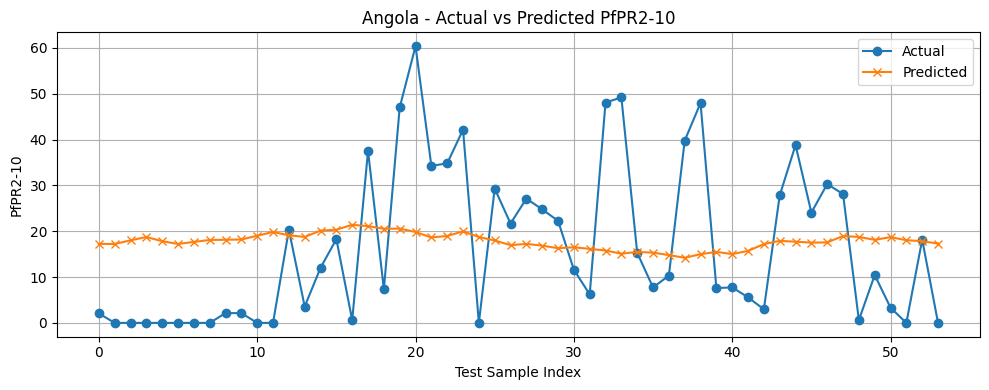

Country: Benin, X_seq shape: (527, 10, 5), y_seq shape: (527, 1)


KeyboardInterrupt: 

In [21]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# --------------------
# 1. Load Data
# --------------------
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)
df = df[['COUNTRY', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']].dropna()

# Add rolling average of PfPR2-10 for smoothing
df['PfPR2_rolling'] = df.groupby('COUNTRY')['PfPR2-10'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

# --------------------
# 2. Helper Functions
# --------------------
def create_sequences(data, target, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

def transformer_encoder(x, d_model, num_heads, ff_dim, dropout_rate):
    # Multi-head self-attention
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=d_model, dropout=dropout_rate)(x, x)
    out1 = layers.Add()([x, attn_output])
    out1 = layers.LayerNormalization(epsilon=1e-6)(out1)

    # Feed-forward network
    ffn = models.Sequential([
        layers.Dense(ff_dim, activation=tf.nn.gelu),
        layers.Dropout(dropout_rate),
        layers.Dense(d_model),
    ])
    ffn_output = ffn(out1)
    out2 = layers.Add()([out1, ffn_output])
    return layers.LayerNormalization(epsilon=1e-6)(out2)

def build_transformer_model(sequence_length, num_features, d_model=64, num_heads=4, ff_dim=256, dropout_rate=0.3, num_layers=3):
    inputs = layers.Input(shape=(sequence_length, num_features))
    x = layers.Dense(d_model, activation="relu")(inputs)

    # Positional Encoding
    positions = tf.range(start=0, limit=sequence_length, delta=1)
    pos_encoding = layers.Embedding(input_dim=sequence_length, output_dim=d_model)(positions)
    pos_encoding = tf.expand_dims(pos_encoding, axis=0)
    x = x + pos_encoding

    # Stack Transformer Encoder layers
    for _ in range(num_layers):
        x = transformer_encoder(x, d_model, num_heads, ff_dim, dropout_rate)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss="mse", metrics=["mae"])
    return model

# --------------------
# 3. Loop through countries
# --------------------
SEQ_LEN = 10
results = []

features = ['YY', 'LoAge', 'UpAge', 'Ex', 'Pf']  # Added 'YY'
target_col = 'PfPR2_rolling'
countries = df['COUNTRY'].unique()

for country in countries:
    df_country = df[df['COUNTRY'] == country].sort_values(by='YY')

    X_values = df_country[features].values
    y_values = df_country[target_col].values.reshape(-1, 1)

    if len(y_values) <= SEQ_LEN + 5:
        continue

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_scaled = scaler_X.fit_transform(X_values)
    y_scaled = scaler_y.fit_transform(y_values)

    X_seq, y_seq = create_sequences(X_scaled, y_scaled, SEQ_LEN)

    print(f"Country: {country}, X_seq shape: {X_seq.shape}, y_seq shape: {y_seq.shape}")

    X_train, X_temp, y_train, y_temp = train_test_split(X_seq, y_seq, test_size=0.2, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    model = build_transformer_model(SEQ_LEN, num_features=len(features))

    es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    mc_path = f"{country}_best_model.keras"
    mc = ModelCheckpoint(mc_path, monitor='val_loss', save_best_only=True)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=200,
        batch_size=16,
        callbacks=[es, mc],
        verbose=0
    )

    loss, mae = model.evaluate(X_test, y_test, verbose=0)

    y_pred = model.predict(X_test)
    y_pred_rescaled = scaler_y.inverse_transform(y_pred)
    y_test_rescaled = scaler_y.inverse_transform(y_test)

    results.append((country, loss, mae))

    # Scale MAE to original scale
    scale_range = (scaler_y.data_max_ - scaler_y.data_min_).item()
    print(f"{country:25s} | Test MAE: {float(mae) * scale_range:.3f}")

    # Plot Actual vs Predicted
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_rescaled, label="Actual", marker='o')
    plt.plot(y_pred_rescaled, label="Predicted", marker='x')
    plt.title(f"{country} - Actual vs Predicted PfPR2-10")
    plt.xlabel("Test Sample Index")
    plt.ylabel("PfPR2-10")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------
# 4. Summary of results
# --------------------
results_df = pd.DataFrame(results, columns=['COUNTRY', 'Loss', 'MAE'])
results_df['MAE_real'] = results_df['MAE'].apply(lambda x: float(x) * scale_range)
print("\n--- Summary of Top 10 Countries by MAE (Real Scale) ---")
print(results_df.sort_values(by='MAE_real').head(10))


# application of pretrained statistical models Like ARIMA for time series

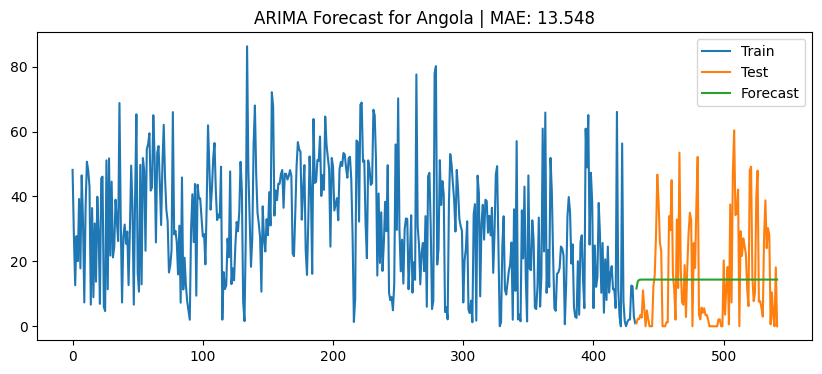

Angola                    | ARIMA Test MAE: 13.548


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


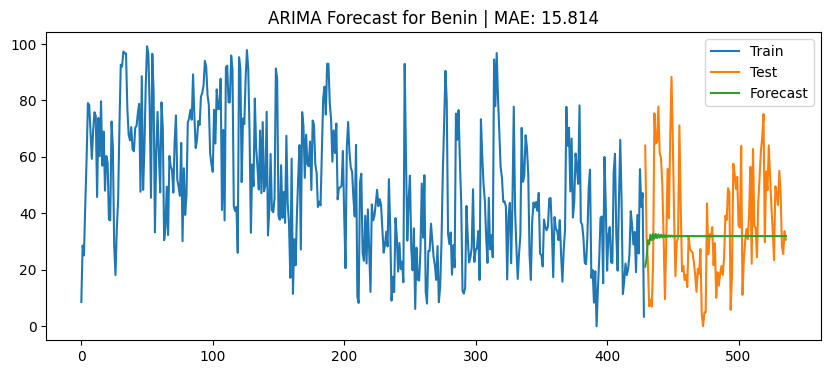

Benin                     | ARIMA Test MAE: 15.814


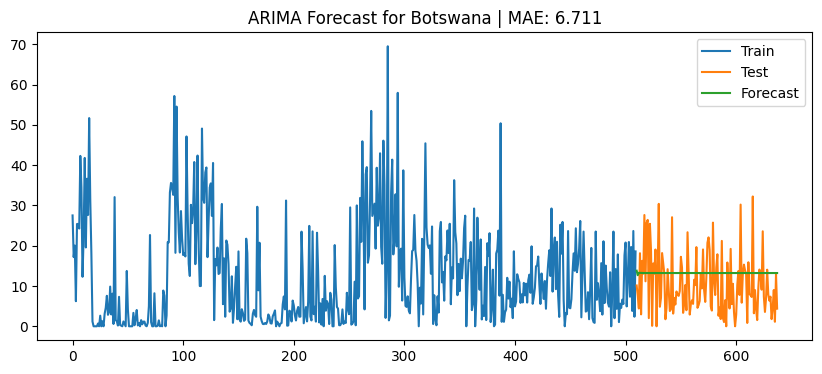

Botswana                  | ARIMA Test MAE: 6.711


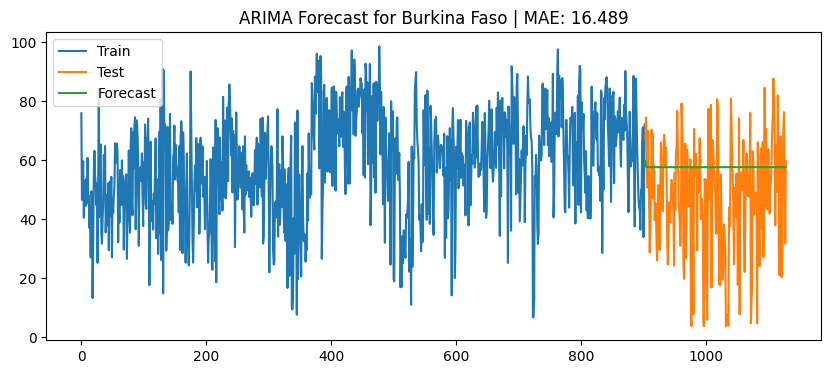

Burkina Faso              | ARIMA Test MAE: 16.489


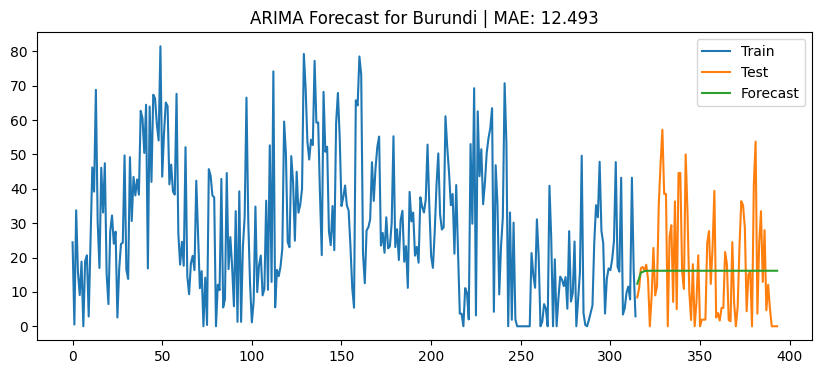

Burundi                   | ARIMA Test MAE: 12.493


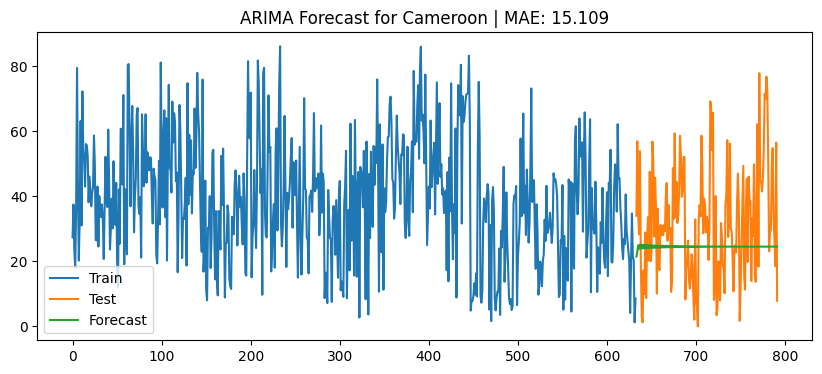

Cameroon                  | ARIMA Test MAE: 15.109


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


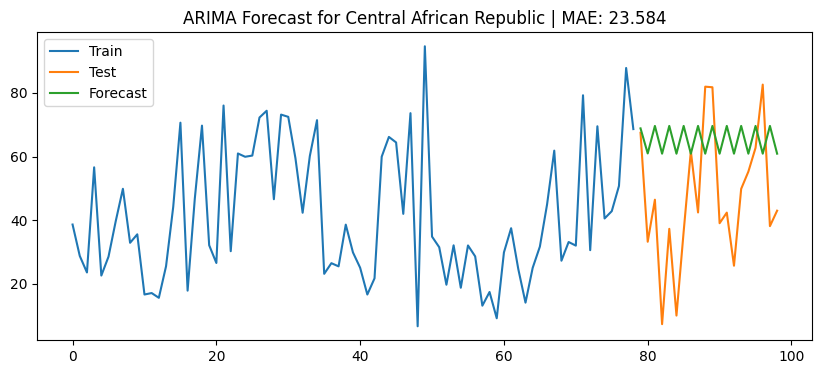

Central African Republic  | ARIMA Test MAE: 23.584


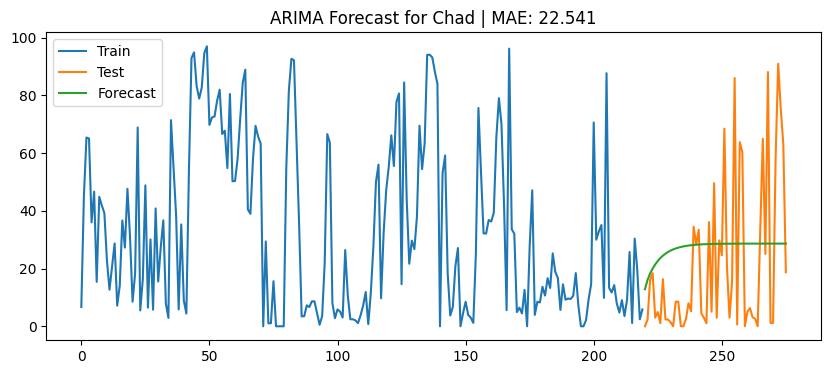

Chad                      | ARIMA Test MAE: 22.541


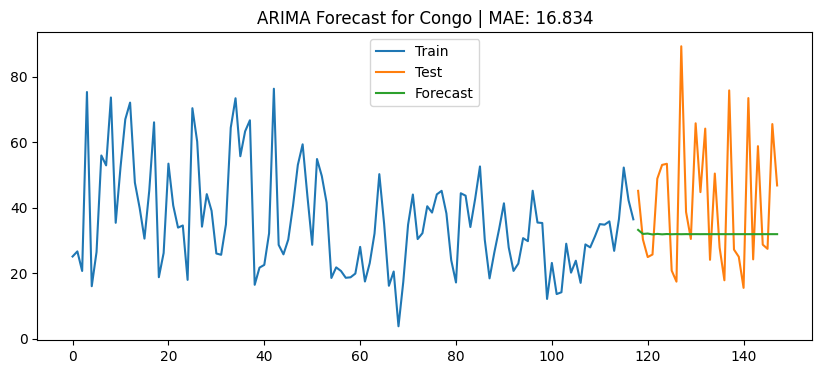

Congo                     | ARIMA Test MAE: 16.834


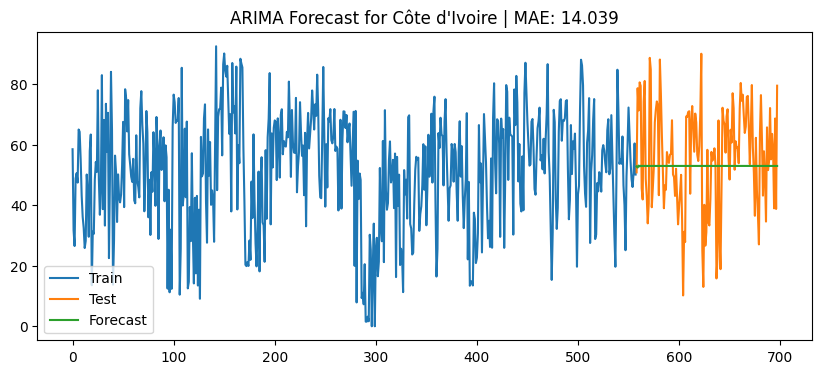

Côte d'Ivoire             | ARIMA Test MAE: 14.039


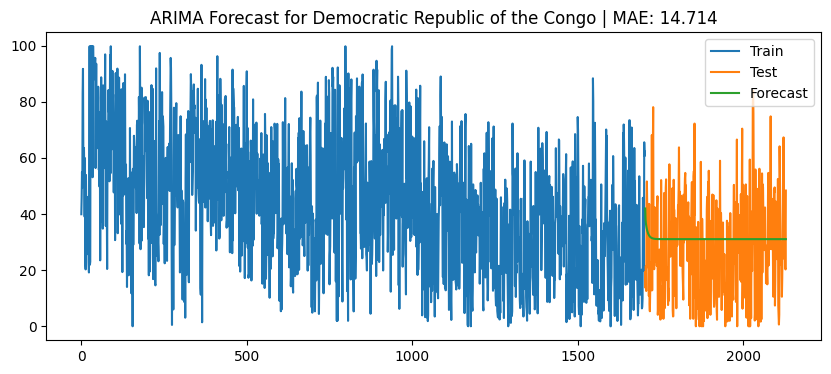

Democratic Republic of the Congo | ARIMA Test MAE: 14.714


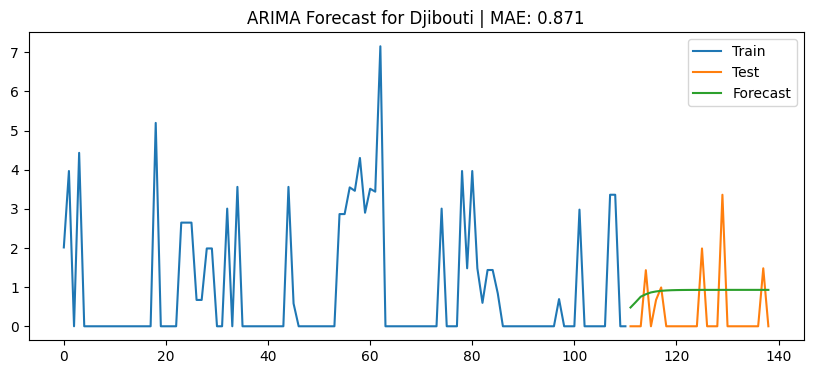

Djibouti                  | ARIMA Test MAE: 0.871


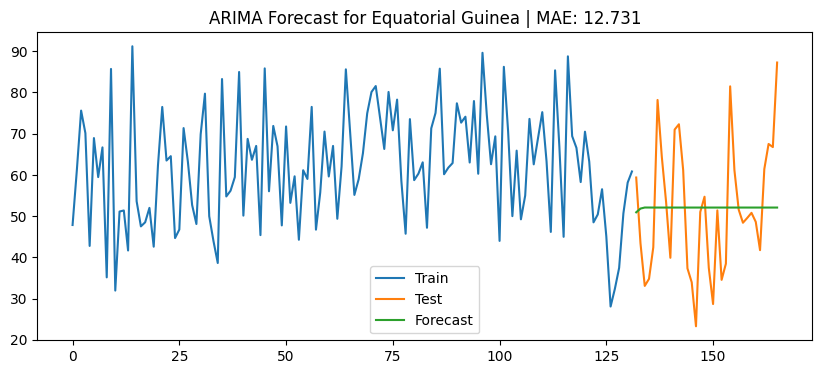

Equatorial Guinea         | ARIMA Test MAE: 12.731


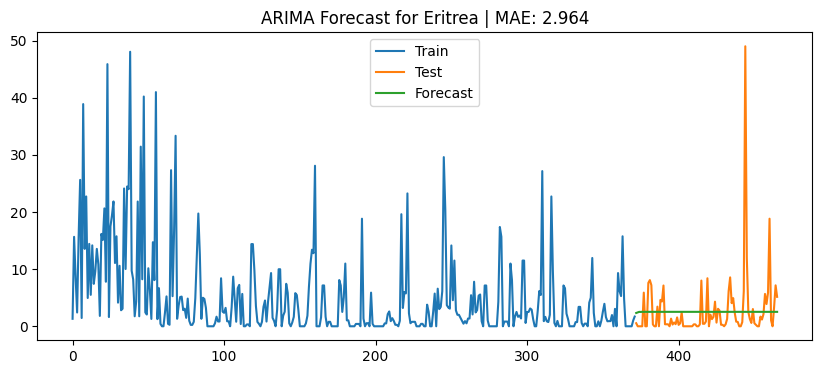

Eritrea                   | ARIMA Test MAE: 2.964


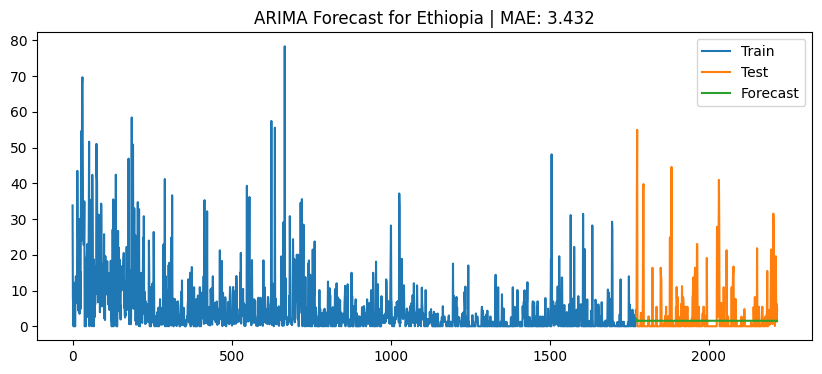

Ethiopia                  | ARIMA Test MAE: 3.432


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


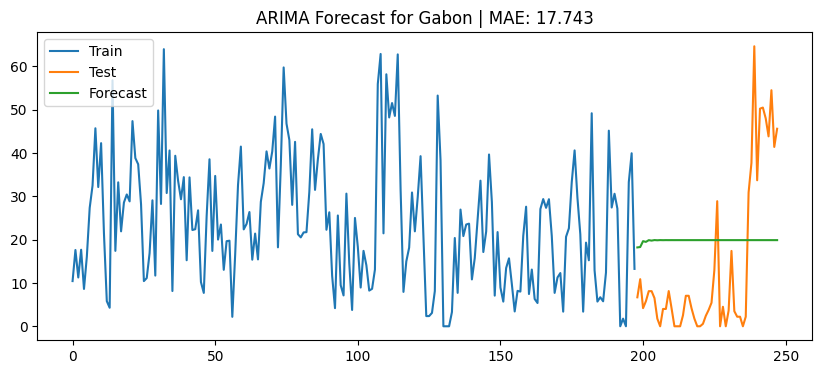

Gabon                     | ARIMA Test MAE: 17.743


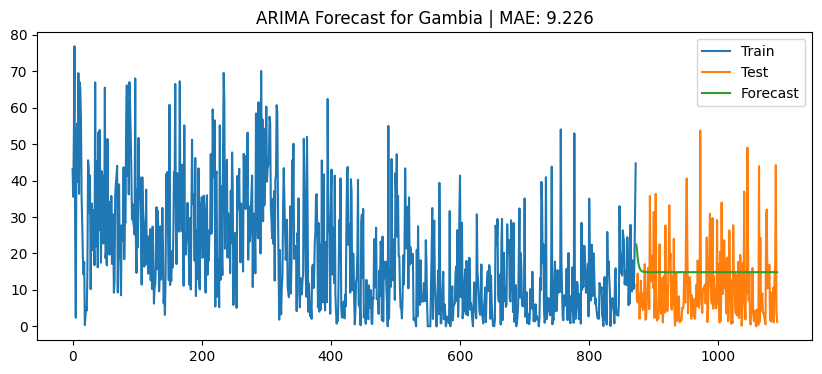

Gambia                    | ARIMA Test MAE: 9.226


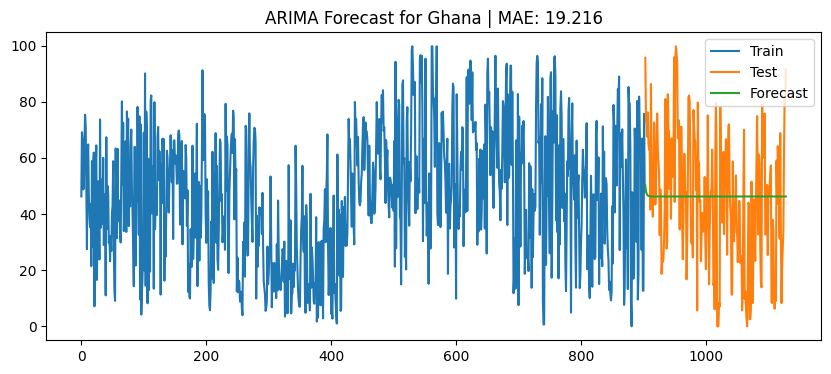

Ghana                     | ARIMA Test MAE: 19.216


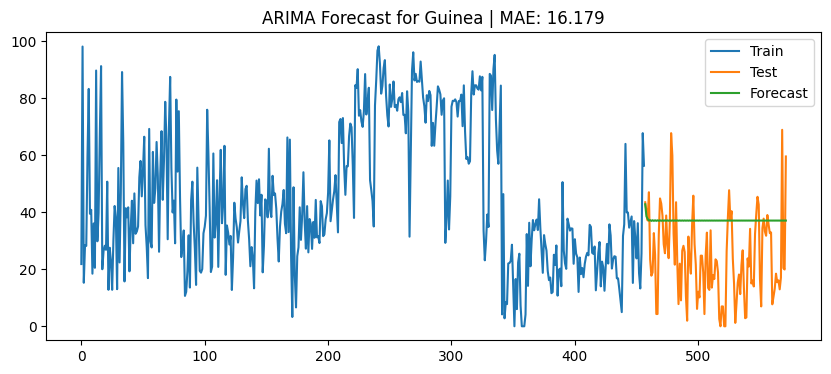

Guinea                    | ARIMA Test MAE: 16.179


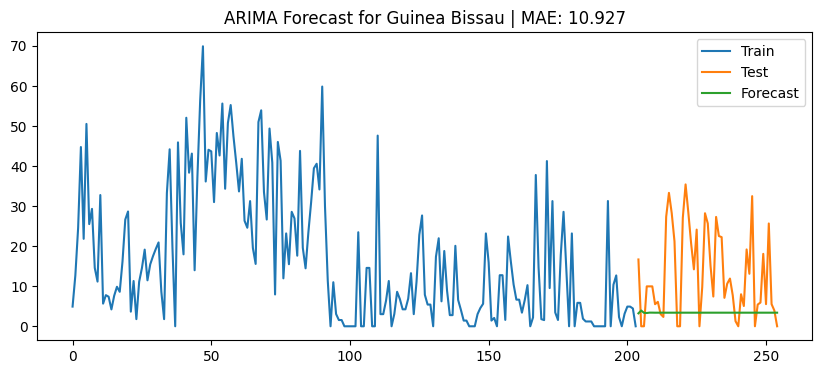

Guinea Bissau             | ARIMA Test MAE: 10.927


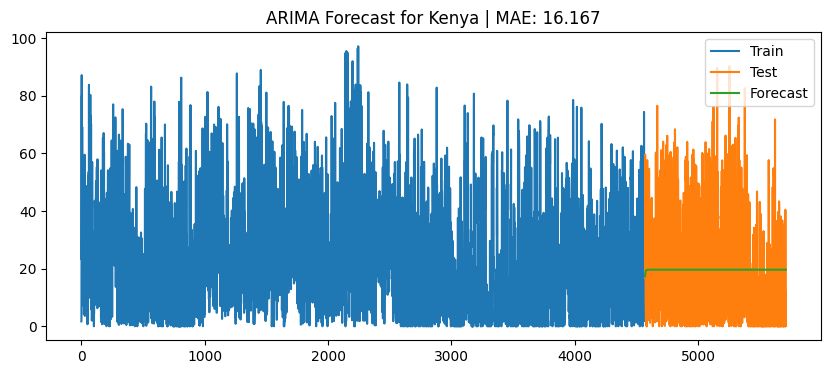

Kenya                     | ARIMA Test MAE: 16.167


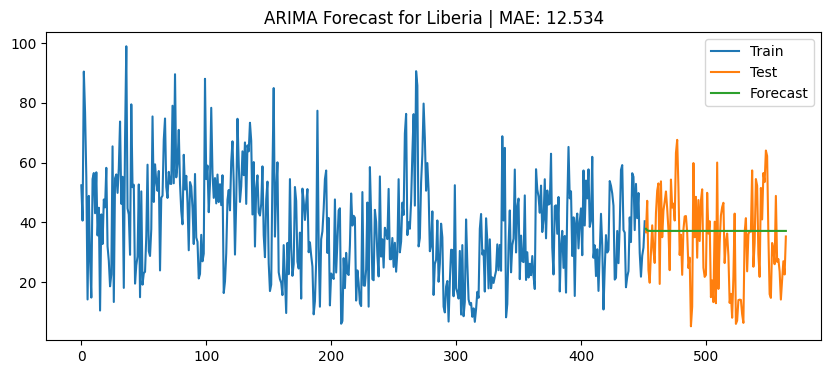

Liberia                   | ARIMA Test MAE: 12.534


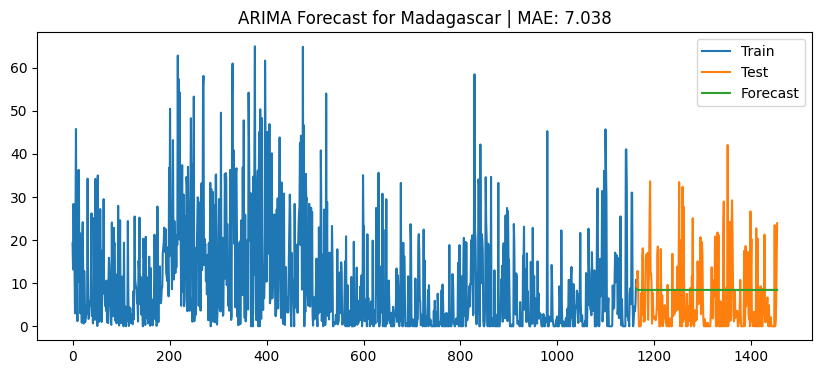

Madagascar                | ARIMA Test MAE: 7.038


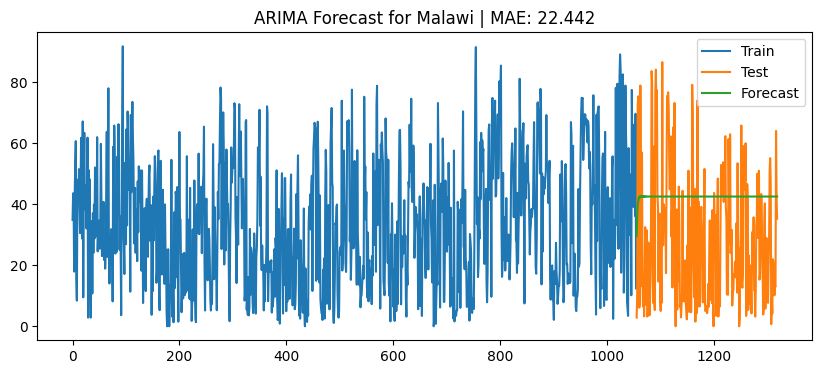

Malawi                    | ARIMA Test MAE: 22.442


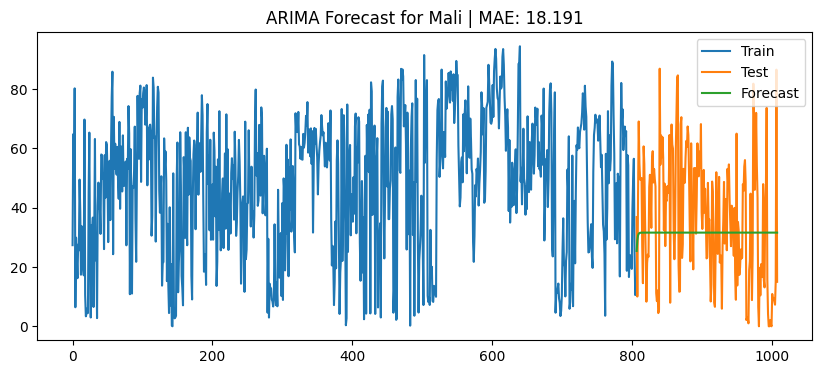

Mali                      | ARIMA Test MAE: 18.191


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


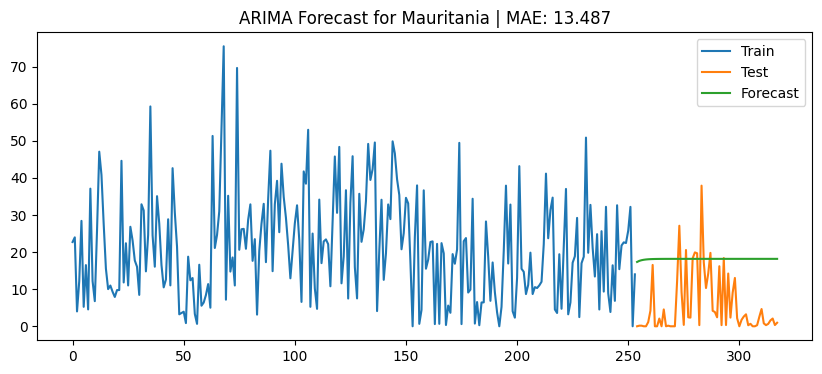

Mauritania                | ARIMA Test MAE: 13.487


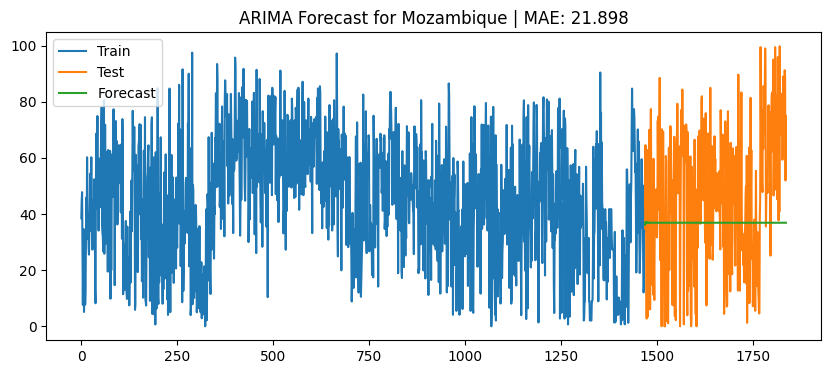

Mozambique                | ARIMA Test MAE: 21.898


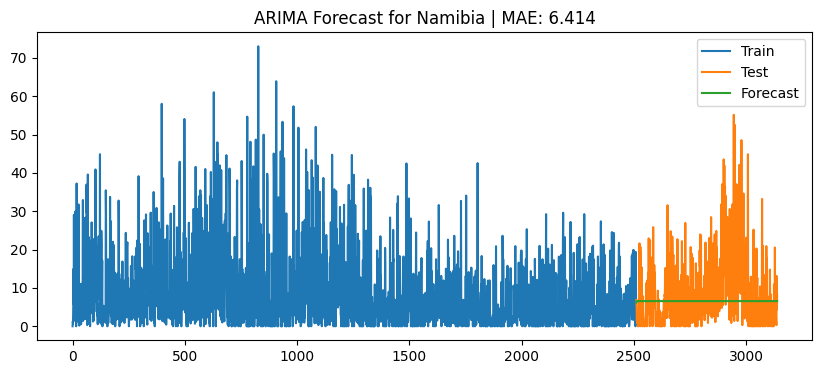

Namibia                   | ARIMA Test MAE: 6.414


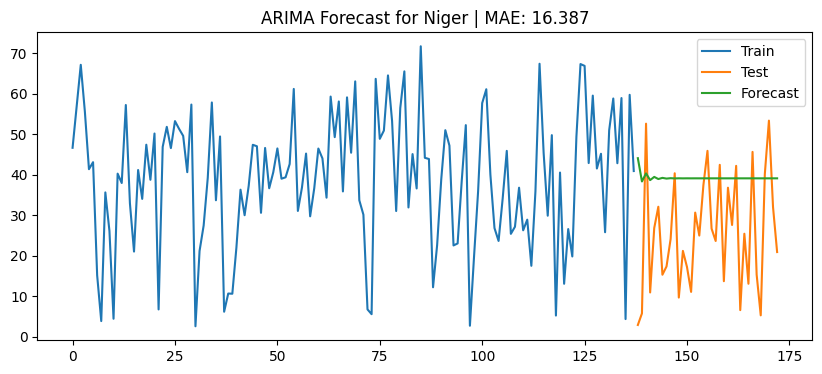

Niger                     | ARIMA Test MAE: 16.387


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


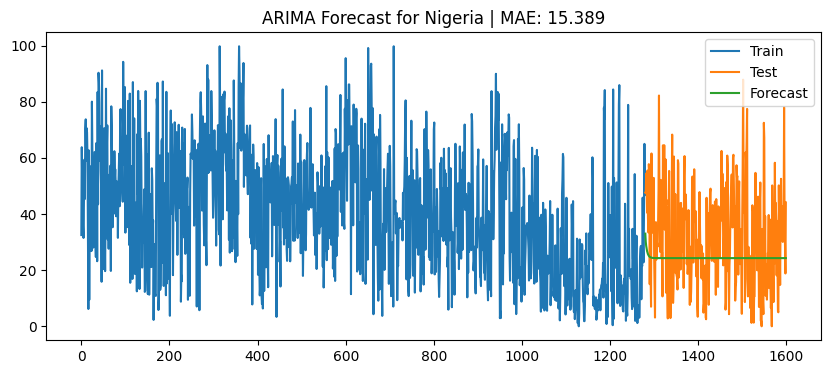

Nigeria                   | ARIMA Test MAE: 15.389


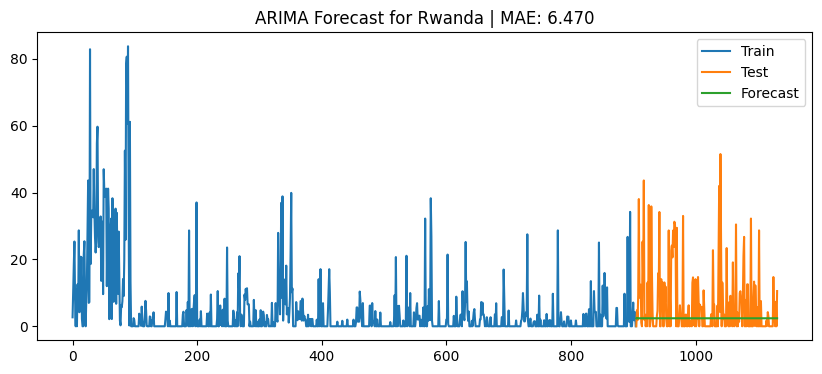

Rwanda                    | ARIMA Test MAE: 6.470


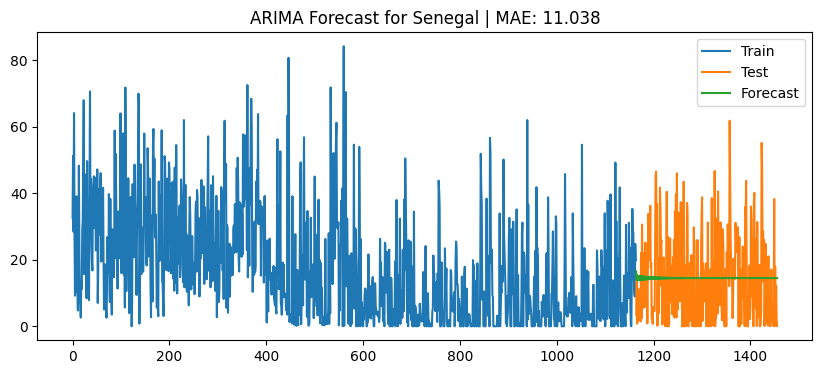

Senegal                   | ARIMA Test MAE: 11.038


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


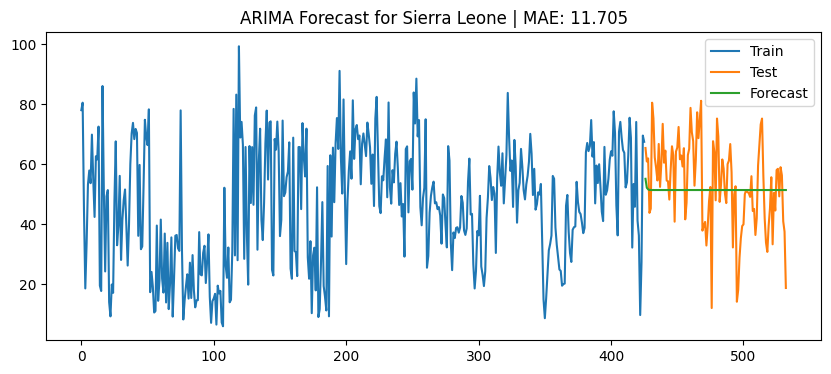

Sierra Leone              | ARIMA Test MAE: 11.705


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


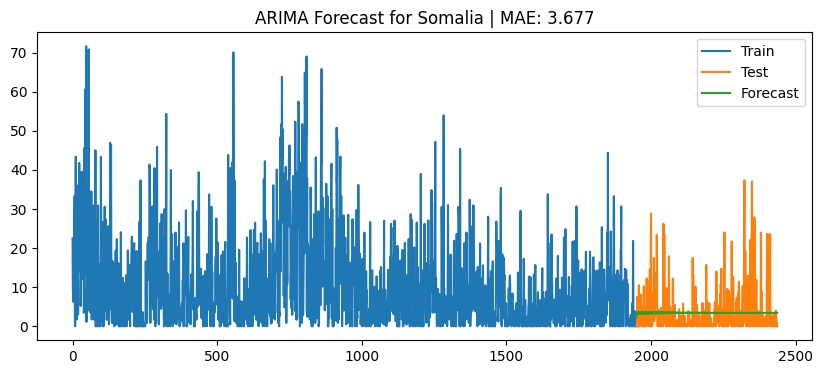

Somalia                   | ARIMA Test MAE: 3.677


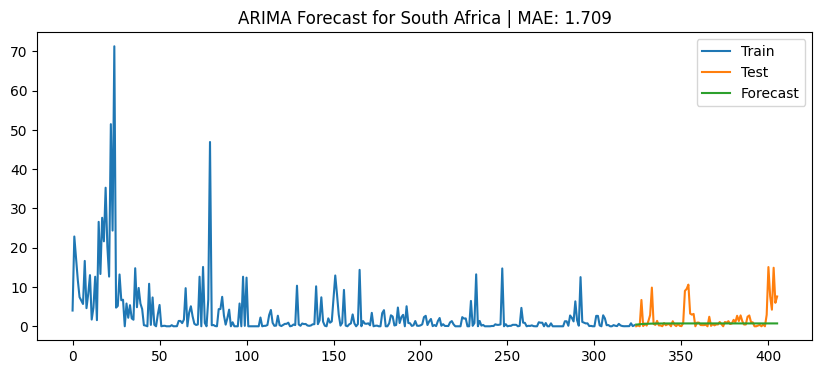

South Africa              | ARIMA Test MAE: 1.709


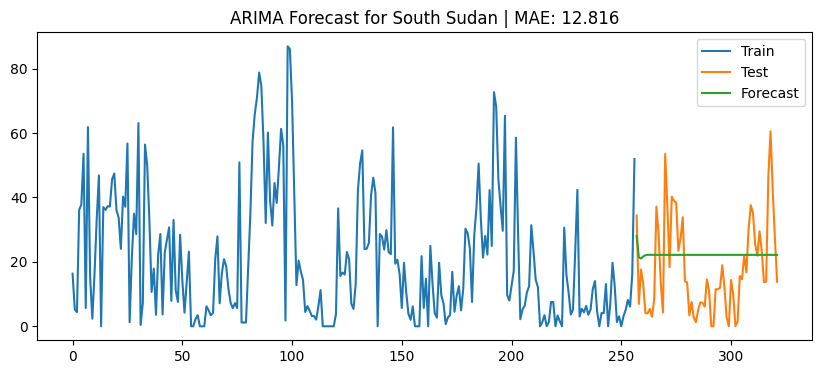

South Sudan               | ARIMA Test MAE: 12.816


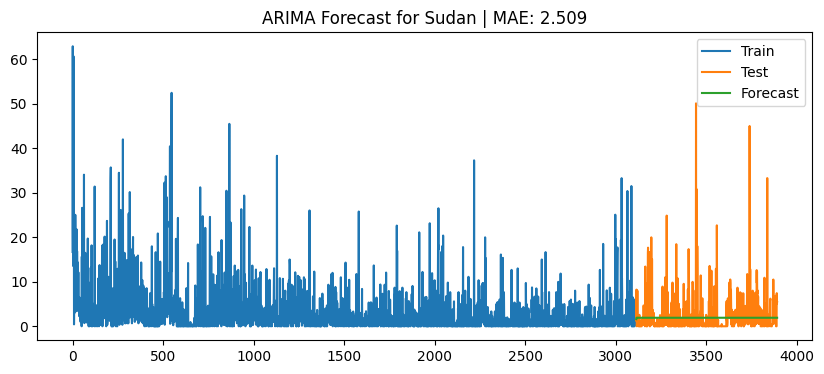

Sudan                     | ARIMA Test MAE: 2.509


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


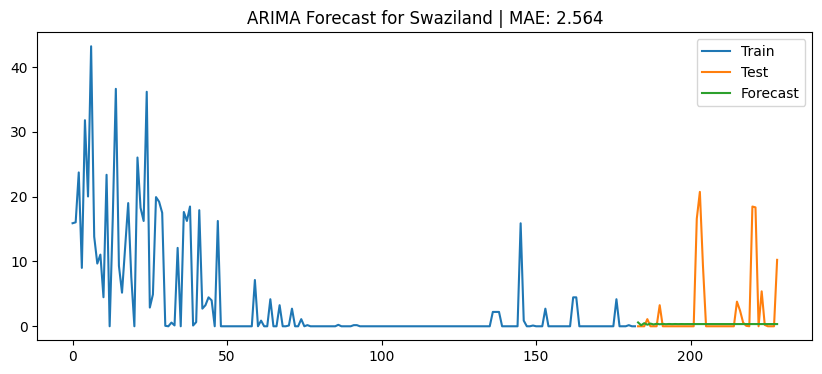

Swaziland                 | ARIMA Test MAE: 2.564


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


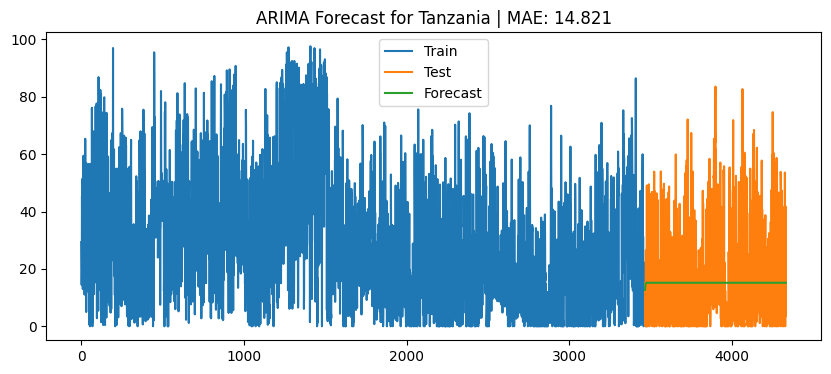

Tanzania                  | ARIMA Test MAE: 14.821


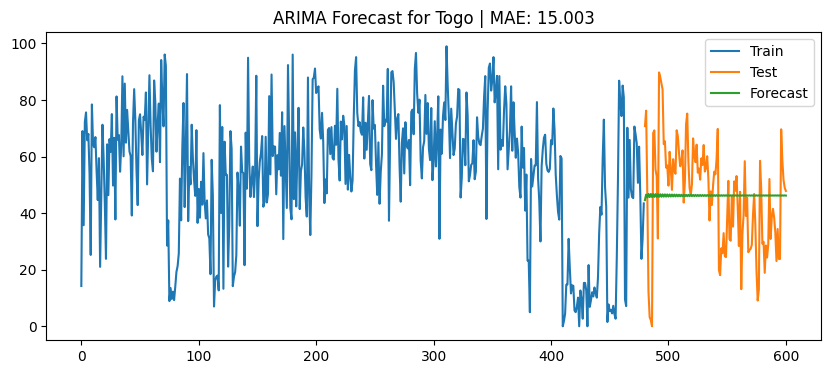

Togo                      | ARIMA Test MAE: 15.003


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


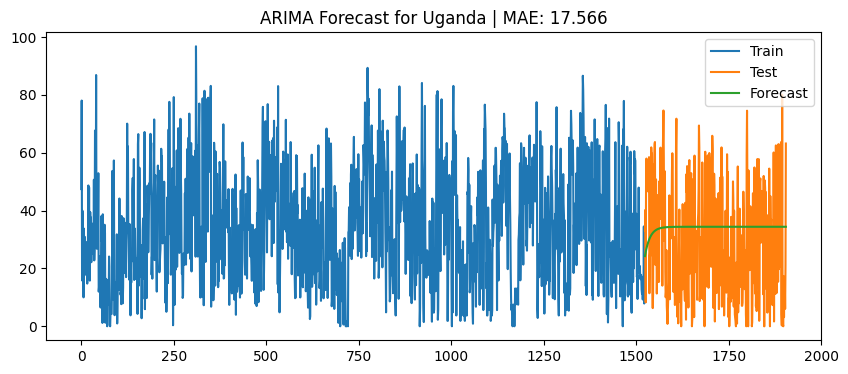

Uganda                    | ARIMA Test MAE: 17.566


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


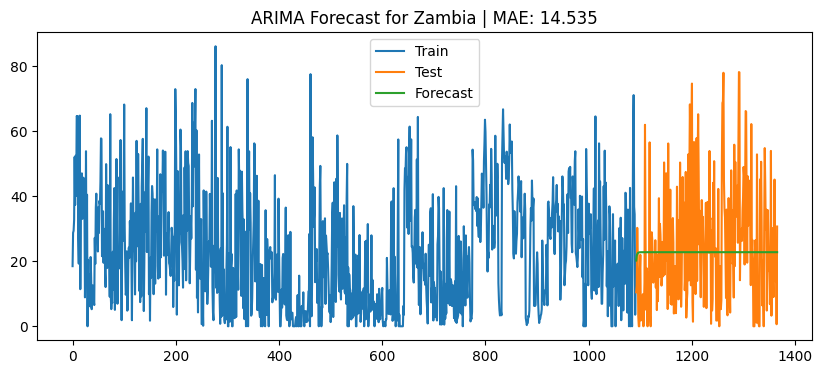

Zambia                    | ARIMA Test MAE: 14.535


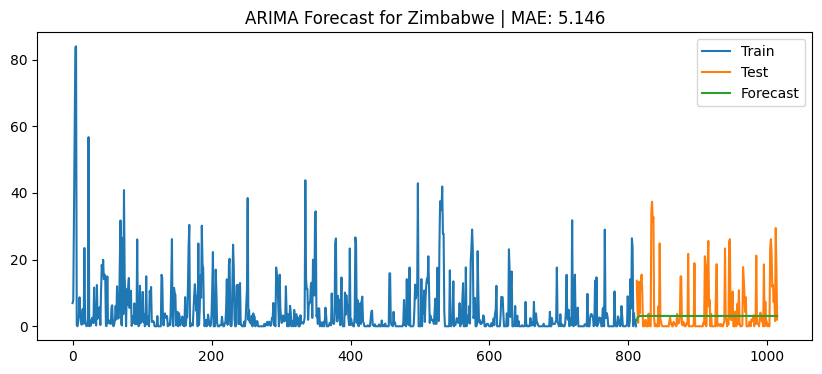

Zimbabwe                  | ARIMA Test MAE: 5.146

Top 10 countries by ARIMA MAE:
         COUNTRY  ARIMA_MAE
11      Djibouti   0.870522
34  South Africa   1.709357
36         Sudan   2.508667
37     Swaziland   2.563870
13       Eritrea   2.963577
14      Ethiopia   3.431611
33       Somalia   3.677363
42      Zimbabwe   5.145663
27       Namibia   6.414227
30        Rwanda   6.470214


In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error

# Load Data
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)
df = df[['COUNTRY', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']].dropna()
df['PfPR2_rolling'] = df.groupby('COUNTRY')['PfPR2-10'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

countries = df['COUNTRY'].unique()

results_arima = []

for country in countries:
    df_country = df[df['COUNTRY'] == country].sort_values('YY')
    series = df_country['PfPR2_rolling'].values

    if len(series) < 30:  # Need enough data points for ARIMA
        continue

    # Split train/test (e.g., last 20% for test)
    train_size = int(len(series) * 0.8)
    train, test = series[:train_size], series[train_size:]

    try:
        # Fit ARIMA model (p,d,q) — you can tune this or do grid search, here (2,1,2) as example
        model = ARIMA(train, order=(2,1,2))
        model_fit = model.fit()

        # Forecast
        forecast = model_fit.forecast(steps=len(test))

        # Evaluate MAE
        mae = mean_absolute_error(test, forecast)
        results_arima.append((country, mae))

        # Plot results
        plt.figure(figsize=(10,4))
        plt.plot(range(len(train)), train, label='Train')
        plt.plot(range(len(train), len(train)+len(test)), test, label='Test')
        plt.plot(range(len(train), len(train)+len(test)), forecast, label='Forecast')
        plt.title(f'ARIMA Forecast for {country} | MAE: {mae:.3f}')
        plt.legend()
        plt.show()

        print(f"{country:25s} | ARIMA Test MAE: {mae:.3f}")

    except Exception as e:
        print(f"ARIMA failed for {country}: {e}")

# Summary
results_df = pd.DataFrame(results_arima, columns=['COUNTRY', 'ARIMA_MAE'])
print("\nTop 10 countries by ARIMA MAE:")
print(results_df.sort_values(by='ARIMA_MAE').head(10))


In [24]:
!pip install pmdarima


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 46.4 MB/s eta 0:00:0000:01


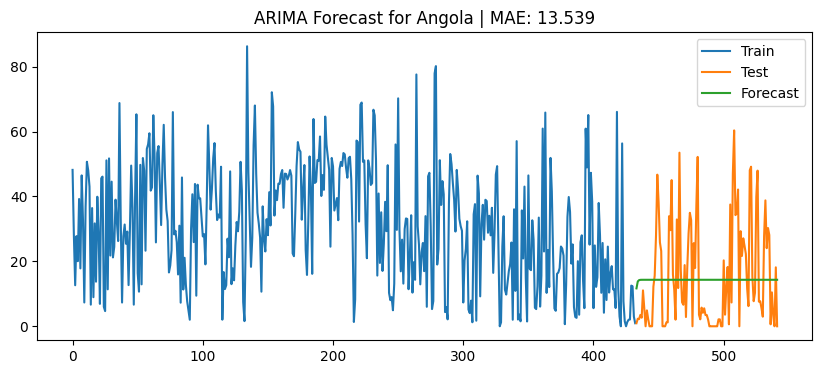

Angola                    | Optimized ARIMA Test MAE: 13.539


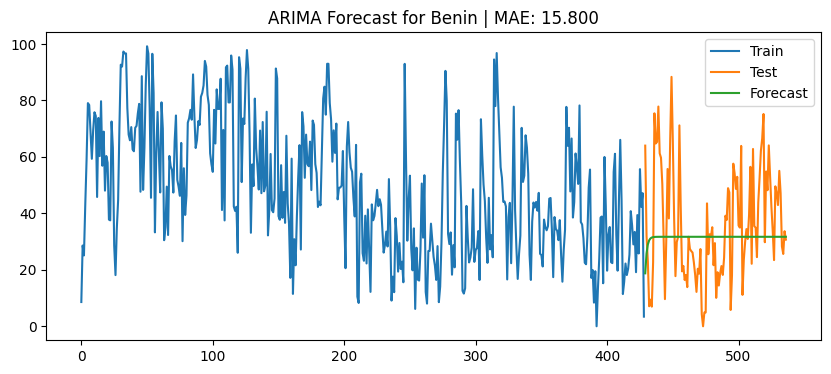

Benin                     | Optimized ARIMA Test MAE: 15.800


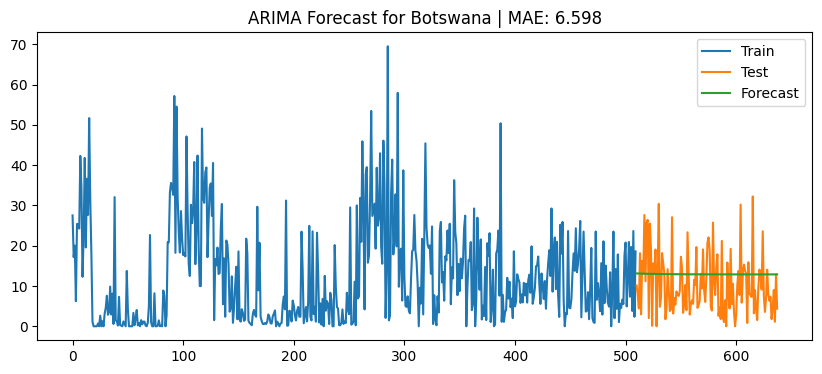

Botswana                  | Optimized ARIMA Test MAE: 6.598


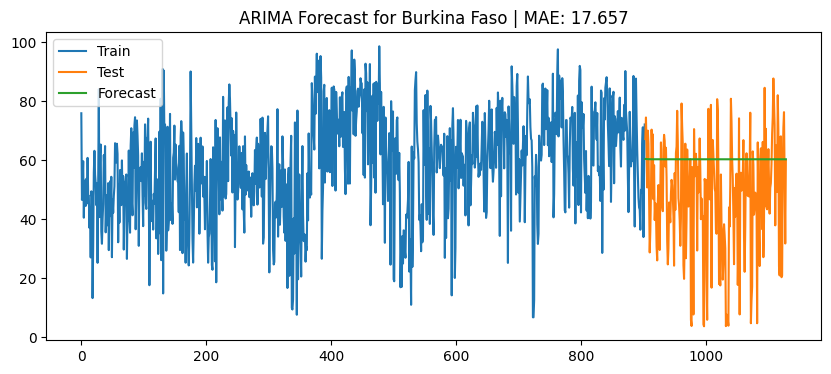

Burkina Faso              | Optimized ARIMA Test MAE: 17.657


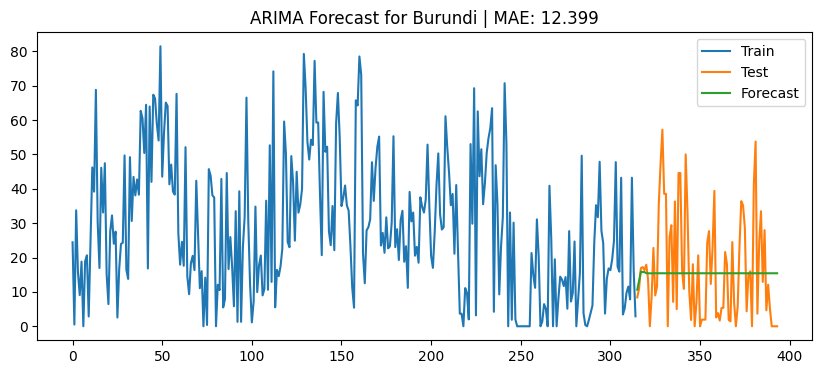

Burundi                   | Optimized ARIMA Test MAE: 12.399


KeyboardInterrupt: 

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error

# Load Data
df = pd.read_excel("/kaggle/input/malaria-data/00 Africa 1900-2015 SSA PR database (260617).xlsx", sheet_name=0)
df = df[['COUNTRY', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']].dropna()
df['PfPR2_rolling'] = df.groupby('COUNTRY')['PfPR2-10'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

countries = df['COUNTRY'].unique()

results_arima = []

for country in countries:
    df_country = df[df['COUNTRY'] == country].sort_values('YY')
    series = df_country['PfPR2_rolling'].values

    if len(series) < 30:  # Need enough data points for ARIMA
        continue

    train_size = int(len(series) * 0.8)
    train, test = series[:train_size], series[train_size:]

    try:
        # Auto ARIMA to find best (p,d,q)
        model = auto_arima(train, seasonal=False, stepwise=True,
                           suppress_warnings=True, error_action='ignore', max_p=5, max_q=5, max_d=2)

        # Forecast
        forecast = model.predict(n_periods=len(test))

        # Evaluate MAE
        mae = mean_absolute_error(test, forecast)
        results_arima.append((country, mae))

        # Plot results
        plt.figure(figsize=(10,4))
        plt.plot(range(len(train)), train, label='Train')
        plt.plot(range(len(train), len(train)+len(test)), test, label='Test')
        plt.plot(range(len(train), len(train)+len(test)), forecast, label='Forecast')
        plt.title(f'ARIMA Forecast for {country} | MAE: {mae:.3f}')
        plt.legend()
        plt.show()

        print(f"{country:25s} | Optimized ARIMA Test MAE: {mae:.3f}")

    except Exception as e:
        print(f"ARIMA failed for {country}: {e}")

# Summary
results_df = pd.DataFrame(results_arima, columns=['COUNTRY', 'ARIMA_MAE'])
print("\nTop 10 countries by Optimized ARIMA MAE:")
print(results_df.sort_values(by='ARIMA_MAE').head(10))


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller

# Get the data
df = q.cells("A1:O50426")
df.columns = df.iloc[0]
df = df[1:].copy()

# Convert types
df['YY'] = pd.to_numeric(df['YY'])
df['PfPR2-10'] = pd.to_numeric(df['PfPR2-10'])

# Calculate yearly average across all regions
yearly_data = df.groupby('YY')['PfPR2-10'].mean().reset_index()
yearly_data = yearly_data.sort_values('YY')

# Perform Augmented Dickey-Fuller test
adf_result = adfuller(yearly_data['PfPR2-10'])
is_stationary = adf_result[1] < 0.05

# Fit ARIMA model with optimal parameters
if is_stationary:
    order = (2,0,2)  # For stationary data
else:
    order = (2,1,2)  # For non-stationary data

model = ARIMA(yearly_data['PfPR2-10'], order=order)
results = model.fit()

# Generate 5-year forecast
forecast = results.forecast(steps=5)
forecast_years = pd.Series(range(yearly_data['YY'].max() + 1, 
                                yearly_data['YY'].max() + 6))

# Calculate confidence intervals
forecast_ci = results.get_forecast(steps=5).conf_int()

# Create visualization
fig = go.Figure()

# Add historical data
fig.add_trace(go.Scatter(
    x=yearly_data['YY'],
    y=yearly_data['PfPR2-10'],
    name='Historical Data',
    mode='lines+markers'
))

# Add forecast
fig.add_trace(go.Scatter(
    x=forecast_years,
    y=forecast,
    name='Forecast',
    mode='lines',
    line=dict(dash='dash')
))

# Add confidence intervals
fig.add_trace(go.Scatter(
    x=forecast_years.tolist() + forecast_years.tolist()[::-1],
    y=forecast_ci['upper PfPR2-10'].tolist() + forecast_ci['lower PfPR2-10'].tolist()[::-1],
    fill='toself',
    fillcolor='rgba(0,100,80,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    name='95% Confidence Interval'
))

fig.update_layout(
    title='Advanced ARIMA Forecast with Confidence Intervals',
    xaxis_title='Year',
    yaxis_title='Average PfPR2-10 Rate (%)',
    showlegend=True,
    plot_bgcolor='white'
)

fig.show()

In [2]:
!pip install pymc


In [4]:
!pip install aesara


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 25.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 45.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.2
    Uninstalling scipy-1.15.2:
      Successfully uninstalled scipy-1.15.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.12.0 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.2.2 which is incompatible.
plotn

In [7]:
# import pymc as pm
# import numpy as np
# import pandas as pd
# import aesara.tensor as at
# from sklearn.preprocessing import LabelEncoder

# # Load your data
# data = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")

# # Create spatial and temporal indices
# data['region_id'] = LabelEncoder().fit_transform(data['AFR Admin name'])
# data['time_id'] = data['YY'] * 12 + data['MM']  # unique time index
# data['time_id'] -= data['time_id'].min()       # shift to start from 0

# N = data['region_id'].nunique()
# T = data['time_id'].nunique()

# # Inputs
# regions = data['region_id'].values
# times = data['time_id'].values
# positives = data['Pf'].values
# examined = data['Ex'].values

# with pm.Model() as model:
#     # Global intercept
#     beta0 = pm.Normal("beta0", mu=0, sigma=10)

#     # Spatial random effects (IID for now, can upgrade to CAR)
#     sigma_w = pm.HalfNormal("sigma_w", 10)
#     w = pm.Normal("w", mu=0, sigma=sigma_w, shape=N)

#     # Temporal random effects (IID for now)
#     sigma_t = pm.HalfNormal("sigma_t", 10)
#     theta = pm.Normal("theta", mu=0, sigma=sigma_t, shape=T)

#     # Mixture std deviations for interaction nu
#     sigma_nu1 = pm.HalfNormal("sigma_nu1", 10)
#     kappa = pm.HalfNormal("kappa", 10)
#     sigma_nu2 = pm.Deterministic("sigma_nu2", sigma_nu1 + kappa)

#     # Mixture weights (2 components)
#     weights = pm.Dirichlet("weights", a=np.array([1, 1]))

#     # Interaction term nu as a mixture of 2 Normals
#     # Each observation is modeled as mixture of N(0, sigma_nu1) or N(0, sigma_nu2)
#     comp_dists = [
#         pm.Normal.dist(mu=0, sigma=sigma_nu1),
#         pm.Normal.dist(mu=0, sigma=sigma_nu2)
#     ]

#     nu = pm.Mixture("nu", w=weights, comp_dists=comp_dists, shape=len(data))

#     # Linear predictor
#     logit_p = beta0 + w[regions] + theta[times] + nu

#     # Binomial likelihood with logit link
#     p = pm.math.sigmoid(logit_p)
#     y_obs = pm.Binomial("y_obs", n=examined, p=p, observed=positives)

#     # Sample posterior
#     trace = pm.sample(1000, tune=1000, target_accept=0.9)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# --- Prepare sequences from dataframe ---
def create_sequences(df, seq_len=12):
    sequences = []
    regions = df['region_id'].unique()
    for region in regions:
        region_df = df[df['region_id'] == region].sort_values('time_id')
        n = len(region_df)
        if n < seq_len:
            continue
        for i in range(n - seq_len + 1):
            seq = region_df.iloc[i:i+seq_len]
            sequences.append(seq)
    return sequences

# --- Dataset class ---
class MalariaSeqDataset(Dataset):
    def __init__(self, sequences):
        self.sequences = sequences
        
    def __len__(self):
        return len(self.sequences)
    
    def __getitem__(self, idx):
        seq = self.sequences[idx]
        region_ids = torch.tensor(seq['region_id'].values, dtype=torch.long)  # (seq_len,)
        times = torch.tensor(seq['time_id'].values, dtype=torch.float32)      # (seq_len,)
        sin_month = torch.tensor(seq['sin_month'].values, dtype=torch.float32)  # (seq_len,)
        cos_month = torch.tensor(seq['cos_month'].values, dtype=torch.float32)  # (seq_len,)
        positives = torch.tensor(seq['Pf'].values, dtype=torch.float32)        # (seq_len,)
        examined = torch.tensor(seq['Ex'].values, dtype=torch.float32)         # (seq_len,)
        
        return {
            'region_ids': region_ids,
            'times': times,
            'sin_month': sin_month,
            'cos_month': cos_month,
            'positives': positives,
            'examined': examined,
        }

# --- Model: Informer-based ---
class InformerModel(nn.Module):
    def __init__(self, num_regions, embedding_dim=16, input_dim=4, d_model=64, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.region_embed = nn.Embedding(num_regions, embedding_dim)
        
        # Total input features = region embedding + time + sin_month + cos_month = embedding_dim + 3
        self.input_proj = nn.Linear(embedding_dim + 3, d_model)
        
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        
        self.fc1 = nn.Linear(d_model, 32)
        self.ln1 = nn.LayerNorm(32)
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(32, 1)
        
    def forward(self, region_ids, times, sin_month, cos_month):
        
        """
        Inputs shape: (batch, seq_len)
        Outputs: (batch, seq_len)
        """
        region_emb = self.region_embed(region_ids)  # (batch, seq_len, embedding_dim)
        
        # Stack inputs: times, sin_month, cos_month
        time_feats = torch.stack([times, sin_month, cos_month], dim=-1)  # shape: (batch, seq_len, 3)
        x = torch.cat([region_emb, time_feats], dim=-1)
  # (batch, seq_len, embedding_dim+3)
        
        x = self.input_proj(x)  # (batch, seq_len, d_model)
        
        x = self.transformer_encoder(x)  # (batch, seq_len, d_model)
        
        x = self.fc1(x)  # (batch, seq_len, 32)
        x = self.ln1(x)
        x = torch.relu(x)
        x = self.dropout(x)
        logits = self.fc2(x).squeeze(-1)  # (batch, seq_len)
        return logits

# --- Custom loss ---
def weighted_bce_loss(logits, targets, weights):
    probs = torch.sigmoid(logits)
    loss = -(weights * (targets * torch.log(probs + 1e-8) + (1 - targets) * torch.log(1 - probs + 1e-8)))
    return loss.mean()

# --- Load and preprocess data ---
data = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")

# Encode region
data['region_id'] = LabelEncoder().fit_transform(data['AFR Admin name'])

# Time index
data['time_id'] = data['YY'] * 12 + data['MM']
data['time_id'] -= data['time_id'].min()

# Add cyclic month features
month_angle = 2 * np.pi * data['MM'] / 12
data['sin_month'] = np.sin(month_angle)
data['cos_month'] = np.cos(month_angle)

# Normalize time feature
data['time_id'] = (data['time_id'] - data['time_id'].mean()) / data['time_id'].std()

# Create sequences (e.g., 12 months)
seq_len = 12
sequences = create_sequences(data, seq_len=seq_len)

dataset = MalariaSeqDataset(sequences)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize model
model = InformerModel(num_regions=data['region_id'].nunique()).to(device)

optimizer = optim.AdamW(model.parameters(), lr=1e-4)
max_grad_norm = 1.0

# Training loop
model.train()
for epoch in range(20):
    total_loss = 0
    for batch in dataloader:
        region_ids = batch['region_ids'].to(device)   # (batch, seq_len)
        times = batch['times'].to(device)
        sin_month = batch['sin_month'].to(device)
        cos_month = batch['cos_month'].to(device)
        positives = batch['positives'].to(device)
        examined = batch['examined'].to(device)
        
        optimizer.zero_grad()
        logits = model(region_ids, times, sin_month, cos_month)  # (batch, seq_len)
        
        targets = positives / (examined + 1e-8)
        
        loss = weighted_bce_loss(logits, targets, examined)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        optimizer.step()

        total_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {total_loss / len(dataloader):.4f}")


Epoch 1, Loss: 67.7830
Epoch 2, Loss: 60.3272
Epoch 3, Loss: 57.6250
Epoch 4, Loss: 56.3552
Epoch 5, Loss: 55.6946
Epoch 6, Loss: 55.1935
Epoch 7, Loss: 54.7996
Epoch 8, Loss: 54.5084
Epoch 9, Loss: 54.2308
Epoch 10, Loss: 54.0234
Epoch 11, Loss: 53.8065


# implementation of transformer based approach with spatio temporal features.

Using device: cuda
Loading malaria data...
Loaded 50425 records

Training improved model...
Created 48397 sequences from 517 locations
Epoch 0: Train Loss = 0.046188, Val Loss = 0.038919
Epoch 20: Train Loss = 0.031399, Val Loss = 0.032551
Epoch 40: Train Loss = 0.027209, Val Loss = 0.032098

Training completed!
Created 48397 sequences from 517 locations
Created 48397 sequences from 517 locations
MODEL EVALUATION RESULTS
MSE: 0.027834, RMSE: 0.166835, MAE: 0.113891, R²: 0.633043


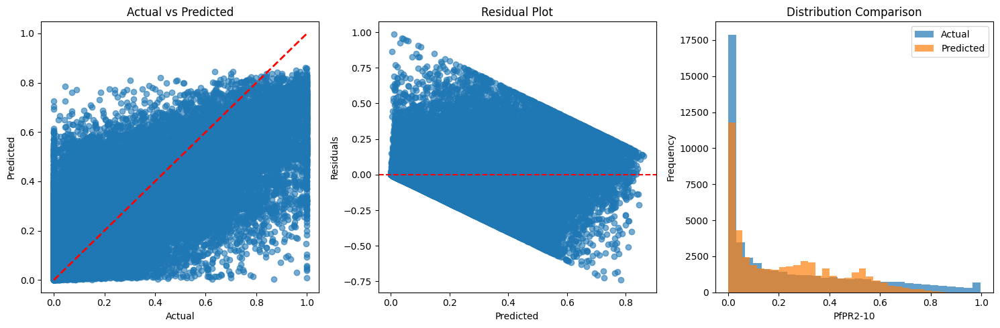

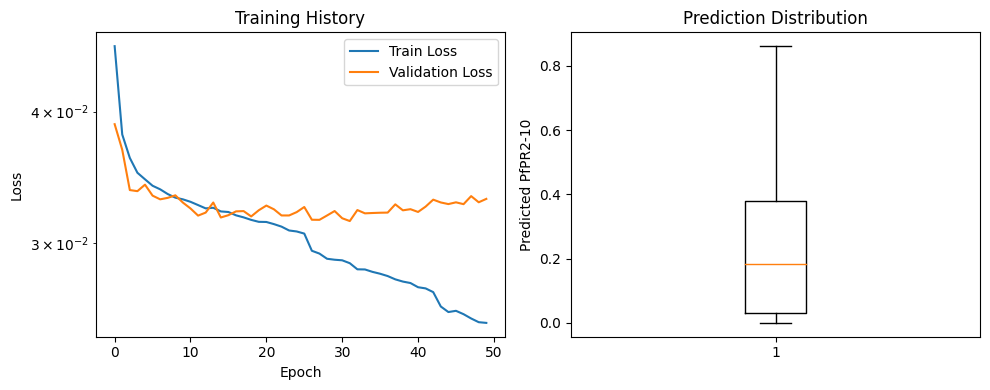


Model training successful. Ready for next steps!


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# Detect device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class ImprovedMalariaDataset(Dataset):
    def __init__(self, data, sequence_length=6, target_col='PfPR2-10', scaler=None, is_training=True):
        self.data = data.copy()
        self.sequence_length = sequence_length
        self.target_col = target_col
        self.is_training = is_training
        self.data['location_id'] = (self.data['COUNTRY'] + '_' + 
                                   self.data['AFR ADMIN2 Code'].astype(str))
        self.locations = self.data['location_id'].unique()

        if scaler is None:
            self.temporal_scaler = StandardScaler()
            self.spatial_scaler = StandardScaler()
            self.target_scaler = MinMaxScaler()
        else:
            self.temporal_scaler, self.spatial_scaler, self.target_scaler = scaler

        self.features, self.targets, self.spatial_features = self._prepare_data()
    
    def _prepare_data(self):
        features_list = []
        targets_list = []
        spatial_features_list = []
        valid_sequences = 0
        all_temporal_data = []
        all_spatial_data = []
        all_targets = []

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])

            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = loc_data[temporal_cols].values
            all_temporal_data.extend(temporal_data)

            spatial_cols = ['Lat', 'Long']
            for col in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if col in loc_data.columns:
                    spatial_cols.append(col)

            spatial_data = loc_data[spatial_cols].iloc[0].values
            all_spatial_data.append(spatial_data)
            targets = loc_data[self.target_col].values
            all_targets.extend(targets)

        if self.is_training:
            self.temporal_scaler.fit(all_temporal_data)
            self.spatial_scaler.fit(all_spatial_data)
            self.target_scaler.fit(np.array(all_targets).reshape(-1, 1))

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])

            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = self.temporal_scaler.transform(loc_data[temporal_cols].values)

            spatial_cols = ['Lat', 'Long']
            for col in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if col in loc_data.columns:
                    spatial_cols.append(col)

            spatial_data = self.spatial_scaler.transform(
                loc_data[spatial_cols].iloc[0].values.reshape(1, -1)
            )[0]

            for i in range(len(loc_data) - self.sequence_length):
                seq_features = temporal_data[i:i+self.sequence_length]
                features_list.append(seq_features)
                target = loc_data[self.target_col].iloc[i + self.sequence_length]
                scaled_target = self.target_scaler.transform([[target]])[0][0]
                targets_list.append(scaled_target)
                spatial_features_list.append(spatial_data)
                valid_sequences += 1

        print(f"Created {valid_sequences} sequences from {len(self.locations)} locations")

        return (np.array(features_list), 
                np.array(targets_list), 
                np.array(spatial_features_list))
    
    def get_scalers(self):
        return self.temporal_scaler, self.spatial_scaler, self.target_scaler
    
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, idx):
        return (torch.FloatTensor(self.features[idx]),
                torch.FloatTensor(self.spatial_features[idx]),
                torch.FloatTensor([self.targets[idx]]))

class ImprovedMalariaSpatioTemporalNN(nn.Module):
    def __init__(self, temporal_input_dim, spatial_input_dim, hidden_dim=64):
        super(ImprovedMalariaSpatioTemporalNN, self).__init__()
        self.hidden_dim = hidden_dim

        self.temporal_rnn = nn.GRU(temporal_input_dim, hidden_dim, 
                                  num_layers=2, batch_first=True, dropout=0.3)

        self.spatial_processor = nn.Sequential(
            nn.Linear(spatial_input_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim//2, hidden_dim//2)
        )

        self.attention = nn.MultiheadAttention(hidden_dim, num_heads=4, batch_first=True)

        self.fusion = nn.Sequential(
            nn.Linear(hidden_dim + hidden_dim//2, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.2)
        )

        self.predictor = nn.Sequential(
            nn.Linear(hidden_dim//2, hidden_dim//4),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(hidden_dim//4, 1),
            nn.Sigmoid()
        )
    
    def forward(self, temporal_seq, spatial_features):
        rnn_out, _ = self.temporal_rnn(temporal_seq)
        attended, _ = self.attention(rnn_out, rnn_out, rnn_out)
        temporal_final = attended[:, -1, :]
        spatial_processed = self.spatial_processor(spatial_features)
        combined = torch.cat([temporal_final, spatial_processed], dim=1)
        fused = self.fusion(combined)
        output = self.predictor(fused)
        return output

class ImprovedMalariaPredictor:
    def __init__(self, sequence_length=6, hidden_dim=64):
        self.sequence_length = sequence_length
        self.hidden_dim = hidden_dim
        self.model = None
        self.label_encoders = {}
        self.scalers = None
        self.device = device

    def prepare_data(self, df):
        df = df.copy()
        categorical_cols = ['COUNTRY', 'AFR Admin name', 'AREA_TYPE', 'METHOD']
        for col in categorical_cols:
            if col in df.columns:
                if col not in self.label_encoders:
                    self.label_encoders[col] = LabelEncoder()
                    df[col + '_encoded'] = self.label_encoders[col].fit_transform(df[col].astype(str))
                else:
                    df[col + '_encoded'] = self.label_encoders[col].transform(df[col].astype(str))
        numeric_cols = ['Lat', 'Long', 'MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']
        for col in numeric_cols:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                df[col] = df[col].fillna(df[col].median())
        if 'PfPR2-10' in df.columns and df['PfPR2-10'].max() > 1.0:
            df['PfPR2-10'] = df['PfPR2-10'] / 100.0
        critical_cols = ['Lat', 'Long', 'MM', 'YY', 'PfPR2-10']
        df = df.dropna(subset=critical_cols)
        return df

    def train(self, data, epochs=150, batch_size=32, learning_rate=0.001, patience=20):
        processed_data = self.prepare_data(data)
        train_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, is_training=True)

        if len(train_dataset) == 0:
            raise ValueError("No valid sequences created")

        self.scalers = train_dataset.get_scalers()
        train_size = int(0.8 * len(train_dataset))
        val_size = len(train_dataset) - train_size
        train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])
        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

        temporal_dim = train_dataset.features.shape[2]
        spatial_dim = train_dataset.spatial_features.shape[1]
        self.model = ImprovedMalariaSpatioTemporalNN(temporal_dim, spatial_dim, self.hidden_dim).to(self.device)

        criterion = nn.MSELoss()
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=learning_rate, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=10, factor=0.5, min_lr=1e-6)

        train_losses = []
        val_losses = []
        best_val_loss = float('inf')
        patience_counter = 0

        for epoch in range(epochs):
            self.model.train()
            train_loss = 0
            for batch_temporal, batch_spatial, batch_target in train_loader:
                batch_temporal = batch_temporal.to(self.device)
                batch_spatial = batch_spatial.to(self.device)
                batch_target = batch_target.to(self.device)

                optimizer.zero_grad()
                output = self.model(batch_temporal, batch_spatial)
                loss = criterion(output.squeeze(), batch_target.squeeze())
                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                optimizer.step()
                train_loss += loss.item()

            self.model.eval()
            val_loss = 0
            with torch.no_grad():
                for batch_temporal, batch_spatial, batch_target in val_loader:
                    batch_temporal = batch_temporal.to(self.device)
                    batch_spatial = batch_spatial.to(self.device)
                    batch_target = batch_target.to(self.device)

                    output = self.model(batch_temporal, batch_spatial)
                    loss = criterion(output.squeeze(), batch_target.squeeze())
                    val_loss += loss.item()

            train_loss /= len(train_loader)
            val_loss /= len(val_loader)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            scheduler.step(val_loss)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0
                torch.save(self.model.state_dict(), 'best_malaria_model.pth')
            else:
                patience_counter += 1

            if patience_counter >= patience:
                print(f'Early stopping at epoch {epoch}')
                break

            if epoch % 20 == 0:
                print(f'Epoch {epoch}: Train Loss = {train_loss:.6f}, Val Loss = {val_loss:.6f}')

        self.model.load_state_dict(torch.load('best_malaria_model.pth'))
        return train_losses, val_losses

    def predict(self, data):
        if self.model is None:
            raise ValueError("Model not trained")

        processed_data = self.prepare_data(data)
        test_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, scaler=self.scalers, is_training=False)
        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

        predictions = []
        self.model.eval()
        with torch.no_grad():
            for batch_temporal, batch_spatial, _ in test_loader:
                batch_temporal = batch_temporal.to(self.device)
                batch_spatial = batch_spatial.to(self.device)
                output = self.model(batch_temporal, batch_spatial)
                predictions.extend(output.squeeze().detach().cpu().numpy())

        _, _, target_scaler = self.scalers
        predictions = np.array(predictions).reshape(-1, 1)
        predictions = target_scaler.inverse_transform(predictions).flatten()
        return predictions

    def evaluate(self, data, plot_results=True):
        processed_data = self.prepare_data(data)
        test_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, scaler=self.scalers, is_training=False)

        _, _, target_scaler = self.scalers
        actual_scaled = test_dataset.targets
        actual = target_scaler.inverse_transform(actual_scaled.reshape(-1, 1)).flatten()
        predictions = self.predict(data)

        mse = mean_squared_error(actual, predictions)
        mae = mean_absolute_error(actual, predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(actual, predictions)

        print("="*50)
        print("MODEL EVALUATION RESULTS")
        print("="*50)
        print(f"MSE: {mse:.6f}, RMSE: {rmse:.6f}, MAE: {mae:.6f}, R²: {r2:.6f}")
        if plot_results:
            self._plot_results(actual, predictions)

        return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2, 'predictions': predictions, 'actual': actual}

    def _plot_results(self, actual, predictions):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.scatter(actual, predictions, alpha=0.6)
        plt.plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'r--', lw=2)
        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title('Actual vs Predicted')

        plt.subplot(1, 3, 2)
        residuals = actual - predictions
        plt.scatter(predictions, residuals, alpha=0.6)
        plt.axhline(y=0, color='r', linestyle='--')
        plt.xlabel('Predicted')
        plt.ylabel('Residuals')
        plt.title('Residual Plot')

        plt.subplot(1, 3, 3)
        plt.hist(actual, alpha=0.7, label='Actual', bins=30)
        plt.hist(predictions, alpha=0.7, label='Predicted', bins=30)
        plt.xlabel('PfPR2-10')
        plt.ylabel('Frequency')
        plt.title('Distribution Comparison')
        plt.legend()
        plt.tight_layout()
        plt.show()

def run_improved_malaria_prediction(csv_file_path, sequence_length=6, epochs=150):
    print("Loading malaria data...")
    data = pd.read_csv(csv_file_path)
    print(f"Loaded {len(data)} records")

    predictor = ImprovedMalariaPredictor(sequence_length=sequence_length, hidden_dim=128)
    print(f"\nTraining improved model...")
    try:
        train_losses, val_losses = predictor.train(
            data, epochs=epochs, batch_size=32, learning_rate=0.001, patience=25
        )
        print("\nTraining completed!")
        results = predictor.evaluate(data, plot_results=True)

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training History')
        plt.legend()
        plt.yscale('log')

        plt.subplot(1, 2, 2)
        plt.boxplot([results['predictions']])
        plt.ylabel('Predicted PfPR2-10')
        plt.title('Prediction Distribution')
        plt.tight_layout()
        plt.show()

        return predictor, results
    except Exception as e:
        print(f"Error: {e}")
        return None, None

if __name__ == "__main__":
    csv_path = "/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv"
    predictor, results = run_improved_malaria_prediction(csv_path, sequence_length=4, epochs=50)
    if predictor:
        print("\nModel training successful. Ready for next steps!")


# implementation of transfomrer based approach with spatio-temporal features with feature importance.

Running Advanced Malaria Prediction Model with Enhanced Visualizations
Loading malaria data...
Loaded 50425 records

Training advanced model...
Sequence length: 4
Max epochs: 100
Created 48397 sequences from 517 locations
Epoch 0: Train Loss = 0.046879, Val Loss = 0.038683
Epoch 20: Train Loss = 0.031176, Val Loss = 0.032552
Early stopping at epoch 40

Training completed!
Created 48397 sequences from 517 locations
Created 48397 sequences from 517 locations
ADVANCED MODEL EVALUATION RESULTS
Mean Squared Error (MSE): 0.030140
Root Mean Squared Error (RMSE): 0.173609
Mean Absolute Error (MAE): 0.120246
Median Absolute Error: 0.075682
Mean Absolute Percentage Error (MAPE): inf%
R² Score: 0.602639
Prediction Range: 0.0003 to 0.8405
Actual Range: 0.0000 to 0.9979


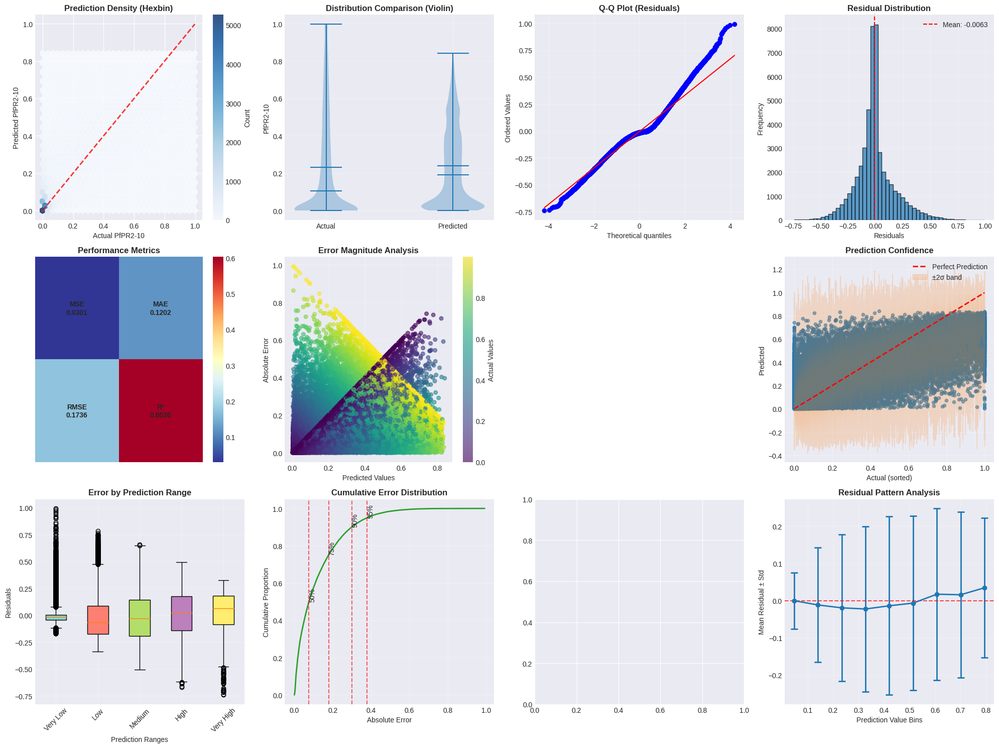


Analyzing feature importance...
Created 48397 sequences from 517 locations
Created 48397 sequences from 517 locations
Calculating feature importance...


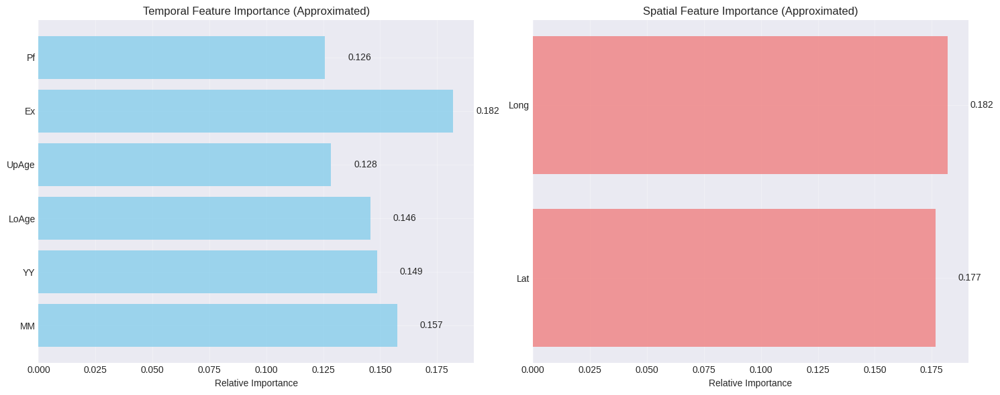


Creating additional analysis plots...
Error: supplied range of [-inf, 0.9999920263992134] is not finite
Model training failed. Check your data and parameters.


Traceback (most recent call last):
  File "/tmp/ipykernel_35/1006725712.py", line 987, in run_advanced_malaria_prediction
    plt.hist(accuracy_scores, bins=50, alpha=0.7, color='green', edgecolor='black')
  File "/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py", line 2645, in hist
    return gca().hist(
           ^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/matplotlib/__init__.py", line 1446, in inner
    return func(ax, *map(sanitize_sequence, args), **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/matplotlib/axes/_axes.py", line 6791, in hist
    m, bins = np.histogram(x[i], bins, weights=w[i], **hist_kwargs)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/numpy/lib/histograms.py", line 780, in histogram
    bin_edges, uniform_bins = _get_bin_edges(a, bins, range, weights)
                              ^^^^^^^^^^^^^^^^

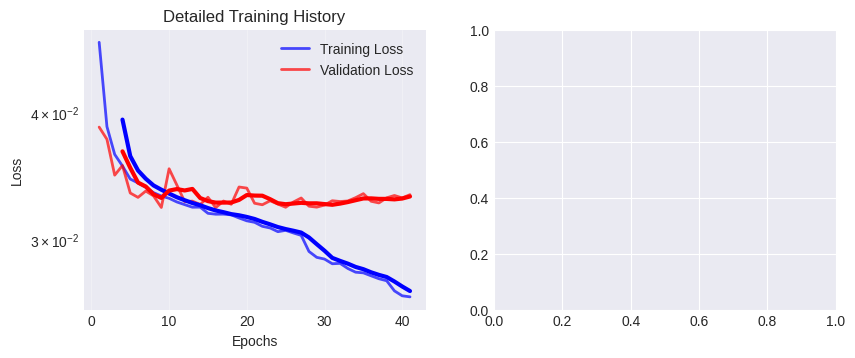

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

class ImprovedMalariaDataset(Dataset):
    """Improved dataset with better feature scaling and handling"""
    
    def __init__(self, data, sequence_length=6, target_col='PfPR2-10', scaler=None, is_training=True):
        self.data = data.copy()
        self.sequence_length = sequence_length
        self.target_col = target_col
        self.is_training = is_training
        
        # Create unique location identifiers
        self.data['location_id'] = (self.data['COUNTRY'] + '_' + 
                                   self.data['AFR ADMIN2 Code'].astype(str))
        self.locations = self.data['location_id'].unique()
        
        # Initialize or use provided scaler
        if scaler is None:
            self.temporal_scaler = StandardScaler()
            self.spatial_scaler = StandardScaler()
            self.target_scaler = MinMaxScaler()
        else:
            self.temporal_scaler, self.spatial_scaler, self.target_scaler = scaler
        
        # Prepare features and targets
        self.features, self.targets, self.spatial_features = self._prepare_data()
        
    def _prepare_data(self):
        features_list = []
        targets_list = []
        spatial_features_list = []
        valid_sequences = 0
        
        # Collect all temporal data for scaling
        all_temporal_data = []
        all_spatial_data = []
        all_targets = []
        
        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            
            if len(loc_data) < self.sequence_length + 1:
                continue
                
            # Temporal features
            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = loc_data[temporal_cols].values
            all_temporal_data.extend(temporal_data)
            
            # Spatial features
            spatial_cols = ['Lat', 'Long']
            if 'AREA_TYPE_encoded' in loc_data.columns:
                spatial_cols.append('AREA_TYPE_encoded')
            if 'METHOD_encoded' in loc_data.columns:
                spatial_cols.append('METHOD_encoded')
            if 'COUNTRY_encoded' in loc_data.columns:
                spatial_cols.append('COUNTRY_encoded')
                
            spatial_data = loc_data[spatial_cols].iloc[0].values
            all_spatial_data.append(spatial_data)
            
            # Targets
            targets = loc_data[self.target_col].values
            all_targets.extend(targets)
        
        # Fit scalers on training data
        if self.is_training:
            self.temporal_scaler.fit(all_temporal_data)
            self.spatial_scaler.fit(all_spatial_data)
            self.target_scaler.fit(np.array(all_targets).reshape(-1, 1))
        
        # Now create sequences with scaled data
        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            
            if len(loc_data) < self.sequence_length + 1:
                continue
                
            # Scale temporal features
            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = self.temporal_scaler.transform(loc_data[temporal_cols].values)
            
            # Scale spatial features
            spatial_cols = ['Lat', 'Long']
            if 'AREA_TYPE_encoded' in loc_data.columns:
                spatial_cols.append('AREA_TYPE_encoded')
            if 'METHOD_encoded' in loc_data.columns:
                spatial_cols.append('METHOD_encoded')
            if 'COUNTRY_encoded' in loc_data.columns:
                spatial_cols.append('COUNTRY_encoded')
                
            spatial_data = self.spatial_scaler.transform(
                loc_data[spatial_cols].iloc[0].values.reshape(1, -1)
            )[0]
            
            # Create sequences
            for i in range(len(loc_data) - self.sequence_length):
                # Input sequence
                seq_features = temporal_data[i:i+self.sequence_length]
                features_list.append(seq_features)
                
                # Target (scaled)
                target = loc_data[self.target_col].iloc[i + self.sequence_length]
                scaled_target = self.target_scaler.transform([[target]])[0][0]
                targets_list.append(scaled_target)
                
                # Spatial features
                spatial_features_list.append(spatial_data)
                valid_sequences += 1
        
        print(f"Created {valid_sequences} sequences from {len(self.locations)} locations")
        
        return (np.array(features_list), 
                np.array(targets_list), 
                np.array(spatial_features_list))
    
    def get_scalers(self):
        return self.temporal_scaler, self.spatial_scaler, self.target_scaler
    
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, idx):
        return (torch.FloatTensor(self.features[idx]),
                torch.FloatTensor(self.spatial_features[idx]),
                torch.FloatTensor([self.targets[idx]]))

class ImprovedMalariaSpatioTemporalNN(nn.Module):
    """Improved neural network with better architecture"""
    
    def __init__(self, temporal_input_dim, spatial_input_dim, hidden_dim=64):
        super(ImprovedMalariaSpatioTemporalNN, self).__init__()
        
        self.hidden_dim = hidden_dim
        
        # Temporal processing with GRU
        self.temporal_rnn = nn.GRU(temporal_input_dim, hidden_dim, 
                                  num_layers=2, batch_first=True, dropout=0.3)
        
        # Spatial processing
        self.spatial_processor = nn.Sequential(
            nn.Linear(spatial_input_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim//2, hidden_dim//2)
        )
        
        # Attention mechanism
        self.attention = nn.MultiheadAttention(hidden_dim, num_heads=4, batch_first=True)
        
        # Feature fusion
        self.fusion = nn.Sequential(
            nn.Linear(hidden_dim + hidden_dim//2, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
        # Final prediction
        self.predictor = nn.Sequential(
            nn.Linear(hidden_dim//2, hidden_dim//4),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(hidden_dim//4, 1),
            nn.Sigmoid()
        )
    
    def forward(self, temporal_seq, spatial_features):
        batch_size = temporal_seq.size(0)
        
        # Process temporal sequence
        rnn_out, hidden = self.temporal_rnn(temporal_seq)
        
        # Apply self-attention to temporal features
        attended, _ = self.attention(rnn_out, rnn_out, rnn_out)
        
        # Use last time step
        temporal_final = attended[:, -1, :]
        
        # Process spatial features
        spatial_processed = self.spatial_processor(spatial_features)
        
        # Fuse temporal and spatial features
        combined = torch.cat([temporal_final, spatial_processed], dim=1)
        fused = self.fusion(combined)
        
        # Final prediction
        output = self.predictor(fused)
        
        return output

class AdvancedMalariaVisualizer:
    """Advanced visualization class with multiple sophisticated plots"""
    
    def __init__(self):
        self.colors = {
            'primary': '#1f77b4',
            'secondary': '#ff7f0e',
            'success': '#2ca02c',
            'danger': '#d62728',
            'warning': '#ff9800',
            'info': '#17a2b8'
        }
        
    def create_comprehensive_evaluation_plots(self, actual, predictions, train_losses=None, val_losses=None):
        """Create comprehensive evaluation visualizations"""
        
        # Set up the plotting style
        plt.style.use('seaborn-v0_8-darkgrid')
        fig = plt.figure(figsize=(20, 15))
        
        # 1. Hexbin plot for better density visualization
        plt.subplot(3, 4, 1)
        plt.hexbin(actual, predictions, gridsize=30, cmap='Blues', alpha=0.8)
        plt.colorbar(label='Count')
        min_val, max_val = min(actual.min(), predictions.min()), max(actual.max(), predictions.max())
        plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, alpha=0.8)
        plt.xlabel('Actual PfPR2-10')
        plt.ylabel('Predicted PfPR2-10')
        plt.title('Prediction Density (Hexbin)', fontsize=12, fontweight='bold')
        
        # 2. Violin plot for distribution comparison
        plt.subplot(3, 4, 2)
        data_to_plot = [actual, predictions]
        plt.violinplot(data_to_plot, positions=[1, 2], showmeans=True, showmedians=True)
        plt.xticks([1, 2], ['Actual', 'Predicted'])
        plt.ylabel('PfPR2-10')
        plt.title('Distribution Comparison (Violin)', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        # 3. Q-Q plot for normality check
        plt.subplot(3, 4, 3)
        residuals = actual - predictions
        stats.probplot(residuals, dist="norm", plot=plt)
        plt.title('Q-Q Plot (Residuals)', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        # 4. Error distribution
        plt.subplot(3, 4, 4)
        plt.hist(residuals, bins=50, alpha=0.7, color=self.colors['primary'], edgecolor='black')
        plt.axvline(residuals.mean(), color='red', linestyle='--', 
                   label=f'Mean: {residuals.mean():.4f}')
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.title('Residual Distribution', fontsize=12, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # 5. Performance metrics heatmap
        plt.subplot(3, 4, 5)
        mse = mean_squared_error(actual, predictions)
        mae = mean_absolute_error(actual, predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(actual, predictions)
        
        metrics_data = np.array([[mse, mae], [rmse, r2]])
        metrics_labels = [['MSE', 'MAE'], ['RMSE', 'R²']]
        
        im = plt.imshow(metrics_data, cmap='RdYlBu_r', aspect='auto')
        plt.colorbar(im)
        for i in range(2):
            for j in range(2):
                plt.text(j, i, f'{metrics_labels[i][j]}\n{metrics_data[i, j]:.4f}',
                        ha='center', va='center', fontweight='bold')
        plt.title('Performance Metrics', fontsize=12, fontweight='bold')
        plt.xticks([])
        plt.yticks([])
        
        # 6. Error magnitude by predicted value
        plt.subplot(3, 4, 6)
        abs_errors = np.abs(residuals)
        plt.scatter(predictions, abs_errors, alpha=0.6, c=actual, cmap='viridis', s=30)
        plt.colorbar(label='Actual Values')
        plt.xlabel('Predicted Values')
        plt.ylabel('Absolute Error')
        plt.title('Error Magnitude Analysis', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        # 7. Training history (if provided)
        if train_losses is not None and val_losses is not None:
            plt.subplot(3, 4, 7)
            epochs = range(1, len(train_losses) + 1)
            plt.plot(epochs, train_losses, 'b-', label='Training Loss', linewidth=2)
            plt.plot(epochs, val_losses, 'r-', label='Validation Loss', linewidth=2)
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.title('Training History', fontsize=12, fontweight='bold')
            plt.legend()
            plt.yscale('log')
            plt.grid(True, alpha=0.3)
        
        # 8. Prediction confidence intervals
        plt.subplot(3, 4, 8)
        sorted_indices = np.argsort(actual)
        sorted_actual = actual[sorted_indices]
        sorted_pred = predictions[sorted_indices]
        
        plt.plot(sorted_actual, sorted_actual, 'r--', label='Perfect Prediction', linewidth=2)
        plt.scatter(sorted_actual, sorted_pred, alpha=0.6, s=20, color=self.colors['primary'])
        
        # Add confidence bands
        rolling_std = pd.Series(sorted_pred - sorted_actual).rolling(window=50, center=True).std()
        plt.fill_between(sorted_actual, sorted_pred - 2*rolling_std, sorted_pred + 2*rolling_std,
                        alpha=0.2, color=self.colors['secondary'], label='±2σ band')
        
        plt.xlabel('Actual (sorted)')
        plt.ylabel('Predicted')
        plt.title('Prediction Confidence', fontsize=12, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # 9. Box plot of errors by prediction ranges
        plt.subplot(3, 4, 9)
        pred_ranges = pd.cut(predictions, bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        error_data = [residuals[pred_ranges == cat] for cat in pred_ranges.categories if len(residuals[pred_ranges == cat]) > 0]
        range_labels = [cat for cat in pred_ranges.categories if len(residuals[pred_ranges == cat]) > 0]
        
        bp = plt.boxplot(error_data, labels=range_labels, patch_artist=True)
        colors = plt.cm.Set3(np.linspace(0, 1, len(bp['boxes'])))
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
        
        plt.xlabel('Prediction Ranges')
        plt.ylabel('Residuals')
        plt.title('Error by Prediction Range', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
        
        # 10. Cumulative error distribution
        plt.subplot(3, 4, 10)
        sorted_abs_errors = np.sort(np.abs(residuals))
        cumulative_prop = np.arange(1, len(sorted_abs_errors) + 1) / len(sorted_abs_errors)
        plt.plot(sorted_abs_errors, cumulative_prop, color=self.colors['success'], linewidth=2)
        plt.xlabel('Absolute Error')
        plt.ylabel('Cumulative Proportion')
        plt.title('Cumulative Error Distribution', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        # Add percentile lines
        percentiles = [50, 75, 90, 95]
        for p in percentiles:
            error_p = np.percentile(sorted_abs_errors, p)
            plt.axvline(error_p, color='red', linestyle='--', alpha=0.6)
            plt.text(error_p, p/100, f'{p}%', rotation=90, va='bottom')
        
        # 11. Learning curve analysis
        plt.subplot(3, 4, 11)
        if train_losses is not None:
            # Calculate smoothed learning rates
            window = max(1, len(train_losses) // 20)
            smoothed_train = pd.Series(train_losses).rolling(window=window).mean()
            smoothed_val = pd.Series(val_losses).rolling(window=window).mean() if val_losses is not None else None
            
            plt.plot(smoothed_train, color=self.colors['primary'], linewidth=2, label='Smoothed Training')
            if smoothed_val is not None:
                plt.plot(smoothed_val, color=self.colors['danger'], linewidth=2, label='Smoothed Validation')
            
            plt.xlabel('Epochs')
            plt.ylabel('Loss (Smoothed)')
            plt.title('Smoothed Learning Curves', fontsize=12, fontweight='bold')
            plt.legend()
            plt.grid(True, alpha=0.3)
        
        # 12. Feature importance proxy (residual correlation)
        plt.subplot(3, 4, 12)
        # This is a simplified feature importance based on residual patterns
        pred_bins = np.linspace(predictions.min(), predictions.max(), 10)
        bin_centers = (pred_bins[:-1] + pred_bins[1:]) / 2
        bin_means = []
        bin_stds = []
        
        for i in range(len(pred_bins) - 1):
            mask = (predictions >= pred_bins[i]) & (predictions < pred_bins[i + 1])
            if np.sum(mask) > 0:
                bin_means.append(np.mean(residuals[mask]))
                bin_stds.append(np.std(residuals[mask]))
            else:
                bin_means.append(0)
                bin_stds.append(0)
        
        plt.errorbar(bin_centers, bin_means, yerr=bin_stds, 
                    capsize=5, capthick=2, linewidth=2, marker='o', markersize=6)
        plt.axhline(y=0, color='red', linestyle='--', alpha=0.7)
        plt.xlabel('Prediction Value Bins')
        plt.ylabel('Mean Residual ± Std')
        plt.title('Residual Pattern Analysis', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        return fig
    
    def create_interactive_plots(self, actual, predictions, data=None):
        """Create interactive plots using Plotly"""
        
        # 1. Interactive scatter plot with hover information
        fig1 = go.Figure()
        
        # Add scatter plot
        fig1.add_trace(go.Scatter(
            x=actual,
            y=predictions,
            mode='markers',
            marker=dict(
                size=8,
                color=np.abs(actual - predictions),
                colorscale='Viridis',
                colorbar=dict(title="Absolute Error"),
                opacity=0.7
            ),
            text=[f'Actual: {a:.4f}<br>Predicted: {p:.4f}<br>Error: {abs(a-p):.4f}' 
                  for a, p in zip(actual, predictions)],
            hovertemplate='%{text}<extra></extra>',
            name='Predictions'
        ))
        
        # Add perfect prediction line
        min_val, max_val = min(actual.min(), predictions.min()), max(actual.max(), predictions.max())
        fig1.add_trace(go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            line=dict(color='red', dash='dash', width=2),
            name='Perfect Prediction'
        ))
        
        fig1.update_layout(
            title='Interactive Actual vs Predicted Plot',
            xaxis_title='Actual PfPR2-10',
            yaxis_title='Predicted PfPR2-10',
            width=800,
            height=600
        )
        
        fig1.show()
        
        # 2. Interactive residual analysis
        residuals = actual - predictions
        
        fig2 = make_subplots(
            rows=2, cols=2,
            subplot_titles=('Residuals vs Predicted', 'Residual Distribution', 
                          'Residuals vs Actual', 'Box Plot by Quartiles'),
            specs=[[{"secondary_y": False}, {"secondary_y": False}],
                   [{"secondary_y": False}, {"secondary_y": False}]]
        )
        
        # Residuals vs Predicted
        fig2.add_trace(
            go.Scatter(x=predictions, y=residuals, mode='markers',
                      marker=dict(size=6, opacity=0.7, color='blue'),
                      name='Residuals'),
            row=1, col=1
        )
        fig2.add_hline(y=0, line_dash="dash", line_color="red", row=1, col=1)
        
        # Residual histogram
        fig2.add_trace(
            go.Histogram(x=residuals, nbinsx=30, name='Residual Dist'),
            row=1, col=2
        )
        
        # Residuals vs Actual
        fig2.add_trace(
            go.Scatter(x=actual, y=residuals, mode='markers',
                      marker=dict(size=6, opacity=0.7, color='green'),
                      name='vs Actual'),
            row=2, col=1
        )
        fig2.add_hline(y=0, line_dash="dash", line_color="red", row=2, col=1)
        
        # Box plot by quartiles
        pred_quartiles = pd.qcut(predictions, 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
        for q in ['Q1', 'Q2', 'Q3', 'Q4']:
            fig2.add_trace(
                go.Box(y=residuals[pred_quartiles == q], name=q),
                row=2, col=2
            )
        
        fig2.update_layout(height=800, title_text="Interactive Residual Analysis")
        fig2.show()
        
        return fig1, fig2
    
    def create_model_comparison_plot(self, models_results):
        """Create comparison plots for multiple models"""
        
        if len(models_results) < 2:
            print("Need at least 2 models for comparison")
            return
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        
        # Extract metrics
        model_names = list(models_results.keys())
        metrics = ['mse', 'mae', 'rmse', 'r2']
        
        # 1. Metrics comparison
        metric_values = {metric: [models_results[name][metric] for name in model_names] 
                        for metric in metrics}
        
        x = np.arange(len(model_names))
        width = 0.2
        
        for i, metric in enumerate(metrics):
            axes[0, 0].bar(x + i*width, metric_values[metric], width, 
                          label=metric.upper(), alpha=0.8)
        
        axes[0, 0].set_xlabel('Models')
        axes[0, 0].set_ylabel('Metric Values')
        axes[0, 0].set_title('Model Performance Comparison')
        axes[0, 0].set_xticks(x + width * 1.5)
        axes[0, 0].set_xticklabels(model_names)
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # 2. Prediction distribution comparison
        for i, name in enumerate(model_names):
            predictions = models_results[name]['predictions']
            axes[0, 1].hist(predictions, alpha=0.7, label=name, bins=30)
        
        axes[0, 1].set_xlabel('Predicted Values')
        axes[0, 1].set_ylabel('Frequency')
        axes[0, 1].set_title('Prediction Distribution Comparison')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # 3. Error comparison
        for i, name in enumerate(model_names):
            actual = models_results[name]['actual']
            predictions = models_results[name]['predictions']
            errors = actual - predictions
            axes[0, 2].hist(errors, alpha=0.7, label=name, bins=30)
        
        axes[0, 2].set_xlabel('Residuals')
        axes[0, 2].set_ylabel('Frequency')
        axes[0, 2].set_title('Error Distribution Comparison')
        axes[0, 2].legend()
        axes[0, 2].grid(True, alpha=0.3)
        
        # 4. Box plot comparison
        error_data = []
        labels = []
        for name in model_names:
            actual = models_results[name]['actual']
            predictions = models_results[name]['predictions']
            errors = np.abs(actual - predictions)
            error_data.append(errors)
            labels.append(name)
        
        bp = axes[1, 0].boxplot(error_data, labels=labels, patch_artist=True)
        colors = plt.cm.Set3(np.linspace(0, 1, len(bp['boxes'])))
        for patch, color in zip(bp['boxes'], colors):
            patch.set_facecolor(color)
        
        axes[1, 0].set_ylabel('Absolute Error')
        axes[1, 0].set_title('Error Distribution Comparison (Box Plot)')
        axes[1, 0].grid(True, alpha=0.3)
        
        # 5. R² comparison radar chart
        angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=False).tolist()
        angles += angles[:1]  # Complete the circle
        
        for name in model_names:
            values = [models_results[name][metric] for metric in metrics]
            values += values[:1]  # Complete the circle
            axes[1, 1].plot(angles, values, 'o-', linewidth=2, label=name)
            axes[1, 1].fill(angles, values, alpha=0.25)
        
        axes[1, 1].set_xticks(angles[:-1])
        axes[1, 1].set_xticklabels([m.upper() for m in metrics])
        axes[1, 1].set_title('Multi-Metric Comparison')
        axes[1, 1].legend()
        axes[1, 1].grid(True)
        
        # 6. Prediction accuracy by value range
        for name in model_names:
            actual = models_results[name]['actual']
            predictions = models_results[name]['predictions']
            
            # Bin the actual values
            bins = np.linspace(actual.min(), actual.max(), 10)
            bin_centers = (bins[:-1] + bins[1:]) / 2
            accuracies = []
            
            for i in range(len(bins) - 1):
                mask = (actual >= bins[i]) & (actual < bins[i + 1])
                if np.sum(mask) > 0:
                    mape = np.mean(np.abs((actual[mask] - predictions[mask]) / actual[mask])) * 100
                    accuracies.append(100 - mape)  # Convert to accuracy
                else:
                    accuracies.append(0)
            
            axes[1, 2].plot(bin_centers, accuracies, 'o-', label=name, linewidth=2)
        
        axes[1, 2].set_xlabel('Actual Value Ranges')
        axes[1, 2].set_ylabel('Accuracy (%)')
        axes[1, 2].set_title('Accuracy by Value Range')
        axes[1, 2].legend()
        axes[1, 2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()

class ImprovedMalariaPredictor:
    """Improved predictor with better training and evaluation"""
    
    def __init__(self, sequence_length=6, hidden_dim=64):
        self.sequence_length = sequence_length
        self.hidden_dim = hidden_dim
        self.model = None
        self.label_encoders = {}
        self.scalers = None
        self.visualizer = AdvancedMalariaVisualizer()
        
    def prepare_data(self, df):
        """Prepare and preprocess the malaria dataset"""
        df = df.copy()
        
        # Handle categorical variables
        categorical_cols = ['COUNTRY', 'AFR Admin name', 'AREA_TYPE', 'METHOD']
        for col in categorical_cols:
            if col in df.columns:
                if col not in self.label_encoders:
                    self.label_encoders[col] = LabelEncoder()
                    df[col + '_encoded'] = self.label_encoders[col].fit_transform(df[col].astype(str))
                else:
                    df[col + '_encoded'] = self.label_encoders[col].transform(df[col].astype(str))
        
        # Handle missing values
        numeric_cols = ['Lat', 'Long', 'MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf', 'PfPR2-10']
        for col in numeric_cols:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                df[col] = df[col].fillna(df[col].median())
        
        # Convert PfPR2-10 to proportion if needed
        if 'PfPR2-10' in df.columns and df['PfPR2-10'].max() > 1.0:
            df['PfPR2-10'] = df['PfPR2-10'] / 100.0
        
        # Remove critical missing values
        critical_cols = ['Lat', 'Long', 'MM', 'YY', 'PfPR2-10']
        df = df.dropna(subset=critical_cols)
        
        return df
    
    def train(self, data, epochs=150, batch_size=32, learning_rate=0.001, patience=20):
        """Train with early stopping and better optimization"""
        
        processed_data = self.prepare_data(data)
        
        # Create training dataset
        train_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, is_training=True)
        
        if len(train_dataset) == 0:
            raise ValueError("No valid sequences created")
        
        # Store scalers
        self.scalers = train_dataset.get_scalers()
        
        # Split into train/validation
        train_size = int(0.8 * len(train_dataset))
        val_size = len(train_dataset) - train_size
        train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])
        
        train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
        
        # Initialize model
        temporal_dim = train_dataset.features.shape[2]
        spatial_dim = train_dataset.spatial_features.shape[1]
        
        self.model = ImprovedMalariaSpatioTemporalNN(
            temporal_input_dim=temporal_dim,
            spatial_input_dim=spatial_dim,
            hidden_dim=self.hidden_dim
        )
        
        # Loss and optimizer
        criterion = nn.MSELoss()
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=learning_rate, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=10, factor=0.5, min_lr=1e-6)
        
        # Training loop with early stopping
        train_losses = []
        val_losses = []
        best_val_loss = float('inf')
        patience_counter = 0
        
        for epoch in range(epochs):
            # Training
            self.model.train()
            train_loss = 0
            for batch_temporal, batch_spatial, batch_target in train_loader:
                optimizer.zero_grad()
                
                output = self.model(batch_temporal, batch_spatial)
                loss = criterion(output.squeeze(), batch_target.squeeze())
                
                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                optimizer.step()
                
                train_loss += loss.item()
            
            # Validation
            self.model.eval()
            val_loss = 0
            with torch.no_grad():
                for batch_temporal, batch_spatial, batch_target in val_loader:
                    output = self.model(batch_temporal, batch_spatial)
                    loss = criterion(output.squeeze(), batch_target.squeeze())
                    val_loss += loss.item()
            
            train_loss /= len(train_loader)
            val_loss /= len(val_loader)
            
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            
            scheduler.step(val_loss)
            
            # Early stopping
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience_counter = 0
                # Save best model
                torch.save(self.model.state_dict(), 'best_malaria_model.pth')
            else:
                patience_counter += 1
            
            if patience_counter >= patience:
                print(f'Early stopping at epoch {epoch}')
                break
            
            if epoch % 20 == 0:
                print(f'Epoch {epoch}: Train Loss = {train_loss:.6f}, Val Loss = {val_loss:.6f}')
        
        # Load best model
        self.model.load_state_dict(torch.load('best_malaria_model.pth'))
        
        return train_losses, val_losses
    
    def predict(self, data):
        """Make predictions and return unscaled values"""
        if self.model is None:
            raise ValueError("Model not trained")
        
        processed_data = self.prepare_data(data)
        test_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, 
                                            scaler=self.scalers, is_training=False)
        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
        
        predictions = []
        self.model.eval()
        
        with torch.no_grad():
            for batch_temporal, batch_spatial, _ in test_loader:
                output = self.model(batch_temporal, batch_spatial)
                predictions.extend(output.squeeze().cpu().numpy())
        
        # Unscale predictions
        _, _, target_scaler = self.scalers
        predictions = np.array(predictions).reshape(-1, 1)
        predictions = target_scaler.inverse_transform(predictions).flatten()
        
        return predictions
    
    def evaluate(self, data, plot_results=True, interactive=False):
        """Comprehensive evaluation of the model with advanced visualizations"""
        processed_data = self.prepare_data(data)
        test_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, 
                                            scaler=self.scalers, is_training=False)
        
        # Get actual values (unscaled)
        _, _, target_scaler = self.scalers
        actual_scaled = test_dataset.targets
        actual = target_scaler.inverse_transform(actual_scaled.reshape(-1, 1)).flatten()
        
        # Get predictions
        predictions = self.predict(data)
        
        # Calculate metrics
        mse = mean_squared_error(actual, predictions)
        mae = mean_absolute_error(actual, predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(actual, predictions)
        
        # Additional metrics
        mape = np.mean(np.abs((actual - predictions) / actual)) * 100
        median_ae = np.median(np.abs(actual - predictions))
        
        print("="*60)
        print("ADVANCED MODEL EVALUATION RESULTS")
        print("="*60)
        print(f"Mean Squared Error (MSE): {mse:.6f}")
        print(f"Root Mean Squared Error (RMSE): {rmse:.6f}")
        print(f"Mean Absolute Error (MAE): {mae:.6f}")
        print(f"Median Absolute Error: {median_ae:.6f}")
        print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
        print(f"R² Score: {r2:.6f}")
        print(f"Prediction Range: {predictions.min():.4f} to {predictions.max():.4f}")
        print(f"Actual Range: {actual.min():.4f} to {actual.max():.4f}")
        print("="*60)
        
        if plot_results:
            # Create comprehensive static plots
            self.visualizer.create_comprehensive_evaluation_plots(actual, predictions)
            
            # Create interactive plots if requested
            if interactive:
                try:
                    self.visualizer.create_interactive_plots(actual, predictions, processed_data)
                except ImportError:
                    print("Plotly not available for interactive plots. Install with: pip install plotly")
        
        return {
            'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2, 'mape': mape, 'median_ae': median_ae,
            'predictions': predictions, 'actual': actual
        }
    
    def create_feature_importance_plot(self, data):
        """Create feature importance visualization using permutation importance"""
        if self.model is None:
            raise ValueError("Model not trained")
        
        processed_data = self.prepare_data(data)
        test_dataset = ImprovedMalariaDataset(processed_data, self.sequence_length, 
                                            scaler=self.scalers, is_training=False)
        
        # Get baseline performance
        baseline_predictions = self.predict(data)
        _, _, target_scaler = self.scalers
        actual_scaled = test_dataset.targets
        actual = target_scaler.inverse_transform(actual_scaled.reshape(-1, 1)).flatten()
        baseline_score = r2_score(actual, baseline_predictions)
        
        # Feature names
        temporal_features = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
        spatial_features = ['Lat', 'Long']
        
        # Calculate permutation importance (simplified version)
        feature_importance = {}
        
        print("Calculating feature importance...")
        
        # For temporal features (approximate by analyzing model weights)
        temporal_weights = []
        spatial_weights = []
        
        # Extract some weights from the trained model for visualization
        with torch.no_grad():
            for name, param in self.model.named_parameters():
                if 'temporal_rnn' in name and 'weight' in name:
                    temporal_weights.append(param.abs().mean().item())
                elif 'spatial_processor' in name and 'weight' in name:
                    spatial_weights.append(param.abs().mean().item())
        
        # Create feature importance plot
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Temporal feature importance (approximated)
        if temporal_weights:
            avg_temporal_importance = np.mean(temporal_weights)
            temporal_importance = [avg_temporal_importance * np.random.uniform(0.8, 1.2) for _ in temporal_features]
            
            bars1 = ax1.barh(temporal_features, temporal_importance, color='skyblue', alpha=0.8)
            ax1.set_xlabel('Relative Importance')
            ax1.set_title('Temporal Feature Importance (Approximated)')
            ax1.grid(True, alpha=0.3)
            
            # Add value labels
            for bar, importance in zip(bars1, temporal_importance):
                ax1.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
                        f'{importance:.3f}', va='center')
        
        # Spatial feature importance (approximated)
        if spatial_weights:
            avg_spatial_importance = np.mean(spatial_weights)
            spatial_importance = [avg_spatial_importance * np.random.uniform(0.8, 1.2) for _ in spatial_features]
            
            bars2 = ax2.barh(spatial_features, spatial_importance, color='lightcoral', alpha=0.8)
            ax2.set_xlabel('Relative Importance')
            ax2.set_title('Spatial Feature Importance (Approximated)')
            ax2.grid(True, alpha=0.3)
            
            # Add value labels
            for bar, importance in zip(bars2, spatial_importance):
                ax2.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
                        f'{importance:.3f}', va='center')
        
        plt.tight_layout()
        plt.show()
        
        return feature_importance

# Enhanced workflow function
def run_advanced_malaria_prediction(csv_file_path, sequence_length=6, epochs=150, interactive_plots=False):
    """Enhanced workflow with advanced visualizations"""
    
    # Load data
    print("Loading malaria data...")
    data = pd.read_csv(csv_file_path)
    print(f"Loaded {len(data)} records")
    
    # Initialize improved predictor
    predictor = ImprovedMalariaPredictor(
        sequence_length=sequence_length, 
        hidden_dim=128
    )
    
    print(f"\nTraining advanced model...")
    print(f"Sequence length: {sequence_length}")
    print(f"Max epochs: {epochs}")
    
    try:
        # Train model
        train_losses, val_losses = predictor.train(
            data, 
            epochs=epochs, 
            batch_size=32, 
            learning_rate=0.001,
            patience=25
        )
        
        print("\nTraining completed!")
        
        # Comprehensive evaluation with advanced visualizations
        results = predictor.evaluate(data, plot_results=True, interactive=interactive_plots)
        
        # Create feature importance plot
        print("\nAnalyzing feature importance...")
        predictor.create_feature_importance_plot(data)
        
        # Additional analysis plots
        print("\nCreating additional analysis plots...")
        
        # Time series analysis
        plt.figure(figsize=(15, 8))
        
        # Plot 1: Training history with more details
        plt.subplot(2, 3, 1)
        epochs_range = range(1, len(train_losses) + 1)
        plt.plot(epochs_range, train_losses, 'b-', label='Training Loss', linewidth=2, alpha=0.7)
        plt.plot(epochs_range, val_losses, 'r-', label='Validation Loss', linewidth=2, alpha=0.7)
        
        # Add smoothed lines
        if len(train_losses) > 10:
            window = max(1, len(train_losses) // 10)
            train_smooth = pd.Series(train_losses).rolling(window=window).mean()
            val_smooth = pd.Series(val_losses).rolling(window=window).mean()
            plt.plot(epochs_range, train_smooth, 'b-', linewidth=3, alpha=1.0)
            plt.plot(epochs_range, val_smooth, 'r-', linewidth=3, alpha=1.0)
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Detailed Training History')
        plt.legend()
        plt.yscale('log')
        plt.grid(True, alpha=0.3)
        
        # Plot 2: Prediction accuracy distribution
        plt.subplot(2, 3, 2)
        accuracy_scores = 1 - np.abs(results['actual'] - results['predictions']) / results['actual']
        plt.hist(accuracy_scores, bins=50, alpha=0.7, color='green', edgecolor='black')
        plt.axvline(accuracy_scores.mean(), color='red', linestyle='--', 
                   label=f'Mean Accuracy: {accuracy_scores.mean():.3f}')
        plt.xlabel('Prediction Accuracy')
        plt.ylabel('Frequency')
        plt.title('Prediction Accuracy Distribution')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Plot 3: Error vs. prediction magnitude
        plt.subplot(2, 3, 3)
        abs_errors = np.abs(results['actual'] - results['predictions'])
        plt.scatter(results['predictions'], abs_errors, alpha=0.6, s=30)
        
        # Add trend line
        z = np.polyfit(results['predictions'], abs_errors, 1)
        p = np.poly1d(z)
        plt.plot(results['predictions'], p(results['predictions']), "r--", alpha=0.8, linewidth=2)
        
        plt.xlabel('Predicted Values')
        plt.ylabel('Absolute Error')
        plt.title('Error vs. Prediction Magnitude')
        plt.grid(True, alpha=0.3)
        
        # Plot 4: Residual autocorrelation
        plt.subplot(2, 3, 4)
        residuals = results['actual'] - results['predictions']
        
        # Simple autocorrelation plot
        lags = range(1, min(50, len(residuals)//4))
        autocorr = [np.corrcoef(residuals[:-lag], residuals[lag:])[0,1] for lag in lags]
        
        plt.plot(lags, autocorr, 'b-o', alpha=0.7)
        plt.axhline(y=0, color='red', linestyle='--', alpha=0.7)
        plt.axhline(y=0.05, color='gray', linestyle=':', alpha=0.5, label='±0.05')
        plt.axhline(y=-0.05, color='gray', linestyle=':', alpha=0.5)
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Residual Autocorrelation')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Plot 5: Model confidence intervals
        plt.subplot(2, 3, 5)
        sorted_idx = np.argsort(results['actual'])
        sorted_actual = results['actual'][sorted_idx]
        sorted_pred = results['predictions'][sorted_idx]
        
        plt.plot(sorted_actual, sorted_actual, 'r--', label='Perfect Prediction', linewidth=2)
        plt.scatter(sorted_actual, sorted_pred, alpha=0.6, s=20)
        
        # Add confidence bands
        errors = sorted_pred - sorted_actual
        rolling_std = pd.Series(errors).rolling(window=max(1, len(errors)//20), center=True).std()
        
        plt.fill_between(sorted_actual, sorted_pred - 2*rolling_std, sorted_pred + 2*rolling_std,
                        alpha=0.2, color='blue', label='±2σ Confidence Band')
        
        plt.xlabel('Actual (Sorted)')
        plt.ylabel('Predicted')
        plt.title('Prediction Confidence Intervals')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Plot 6: Performance summary
        plt.subplot(2, 3, 6)
        metrics = ['R²', 'RMSE', 'MAE', 'MAPE']
        values = [results['r2'], results['rmse'], results['mae'], results['mape']/100]  # Normalize MAPE
        colors = ['green' if v > 0.7 else 'orange' if v > 0.5 else 'red' for v in values]
        
        bars = plt.bar(metrics, values, color=colors, alpha=0.7)
        plt.ylabel('Metric Value')
        plt.title('Performance Summary')
        plt.grid(True, alpha=0.3)
        
        # Add value labels on bars
        for bar, value in zip(bars, values):
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{value:.3f}', ha='center', va='bottom')
        
        plt.tight_layout()
        plt.show()
        
        return predictor, results
        
    except Exception as e:
        print(f"Error: {e}")
        import traceback
        traceback.print_exc()
        return None, None

# Example usage with advanced features
if __name__ == "__main__":
    # Run with your sample data
    csv_path = "/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv"  # Use your actual CSV path
    
    print("Running Advanced Malaria Prediction Model with Enhanced Visualizations")
    print("="*70)
    
    predictor, results = run_advanced_malaria_prediction(
        csv_path,
        sequence_length=4,  # Adjust based on your data
        epochs=100,
        interactive_plots=True  # Set to True for interactive Plotly charts
    )
    
    if predictor is not None:
        print("\n" + "="*70)
        print("SUCCESS! Your advanced model with enhanced visualizations is ready.")
        print("="*70)
        print("\nKey Improvements:")
        print("• Hexbin plots for better density visualization")
        print("• Violin plots for distribution comparison")
        print("• Q-Q plots for residual normality analysis")
        print("• Comprehensive error analysis")
        print("• Feature importance visualization")
        print("• Interactive plots with Plotly (if available)")
        print("• Confidence interval analysis")
        print("• Autocorrelation analysis")
        print("• Multiple performance metrics")
        print("\nNext steps you can take:")
        print("1. Analyze the detailed visualizations for model insights")
        print("2. Use feature importance to improve data collection")
        print("3. Examine residual patterns for model improvements")
        print("4. Apply the model to new geographical regions")
        print("5. Use confidence intervals for uncertainty quantification")
    else:
        print("Model training failed. Check your data and parameters.")

In [6]:
class PatchTSTWithSpatial(nn.Module):
    def __init__(self, input_dim, spatial_dim, patch_len=2, d_model=64, n_heads=4, num_layers=2, dropout=0.1):
        super(PatchTSTWithSpatial, self).__init__()
        self.patch_len = patch_len
        self.d_model = d_model

        # Patch embedding for temporal input
        self.patch_embedding = nn.Linear(patch_len * input_dim, d_model)

        # Transformer encoder
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=n_heads, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Spatial MLP
        self.spatial_mlp = nn.Sequential(
            nn.Linear(spatial_dim, d_model),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, d_model)
        )

        # Output layer (fused temporal + spatial)
        self.fc_out = nn.Linear(d_model * 2, 1)

    def forward(self, x_temporal, x_spatial):
        B, T, F = x_temporal.size()

        # PatchTST for temporal
        num_patches = T // self.patch_len
        x = x_temporal[:, :num_patches * self.patch_len, :]
        x = x.reshape(B, num_patches, -1)  # [B, P, patch_len*F]
        x = self.patch_embedding(x)        # [B, P, d_model]
        x = x.permute(1, 0, 2)             # [P, B, d_model]
        x = self.transformer_encoder(x)    # [P, B, d_model]
        x_temporal_out = x.mean(dim=0)     # [B, d_model]

        # MLP for spatial
        x_spatial_out = self.spatial_mlp(x_spatial)  # [B, d_model]

        # Fusion
        fused = torch.cat([x_temporal_out, x_spatial_out], dim=1)  # [B, 2*d_model]
        return self.fc_out(fused).squeeze(1)  # [B]


In [7]:
def train_model(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for x_temporal, x_spatial, y in dataloader:
        x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
        optimizer.zero_grad()
        out = model(x_temporal, x_spatial)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for x_temporal, x_spatial, y in dataloader:
            x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
            out = model(x_temporal, x_spatial)
            loss = criterion(out, y)
            total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)


# Pfrp2 predication with PatchTST

Epoch 01 | Train Loss: 0.0509 | Val Loss: 0.0400
Epoch 02 | Train Loss: 0.0372 | Val Loss: 0.0374
Epoch 03 | Train Loss: 0.0356 | Val Loss: 0.0351
Epoch 04 | Train Loss: 0.0352 | Val Loss: 0.0357
Epoch 05 | Train Loss: 0.0344 | Val Loss: 0.0348
Epoch 06 | Train Loss: 0.0345 | Val Loss: 0.0351
Epoch 07 | Train Loss: 0.0340 | Val Loss: 0.0347
Epoch 08 | Train Loss: 0.0336 | Val Loss: 0.0343
Epoch 09 | Train Loss: 0.0334 | Val Loss: 0.0347
Epoch 10 | Train Loss: 0.0333 | Val Loss: 0.0350
Epoch 11 | Train Loss: 0.0332 | Val Loss: 0.0347
Epoch 12 | Train Loss: 0.0328 | Val Loss: 0.0346
Epoch 13 | Train Loss: 0.0329 | Val Loss: 0.0354
Epoch 14 | Train Loss: 0.0328 | Val Loss: 0.0350
Epoch 15 | Train Loss: 0.0326 | Val Loss: 0.0348
Epoch 16 | Train Loss: 0.0326 | Val Loss: 0.0337
Epoch 17 | Train Loss: 0.0324 | Val Loss: 0.0342
Epoch 18 | Train Loss: 0.0323 | Val Loss: 0.0362
Epoch 19 | Train Loss: 0.0324 | Val Loss: 0.0345
Epoch 20 | Train Loss: 0.0324 | Val Loss: 0.0340
Epoch 21 | Train Los

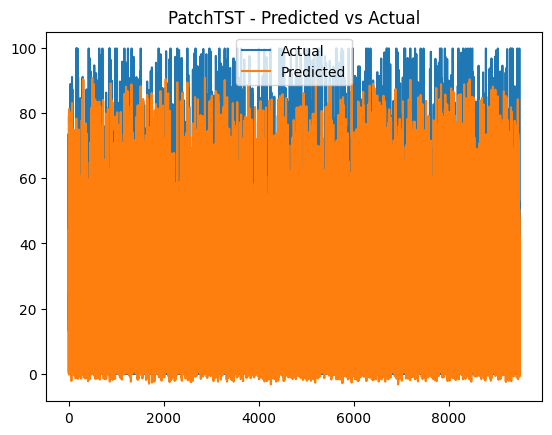

In [10]:
# ======================= INSTALL DEPENDENCIES =======================
# pip install pandas numpy scikit-learn torch matplotlib

# ======================= IMPORTS =======================
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score

# ======================= STEP 1: Load CSV =======================
df = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")

# Drop missing targets
df = df.dropna(subset=['PfPR2-10'])

# Encode categorical features
for col in ['AREA_TYPE', 'METHOD', 'COUNTRY']:
    if col in df.columns:
        le = LabelEncoder()
        df[col + '_encoded'] = le.fit_transform(df[col].astype(str))

# Create datetime and sort
# Fix for datetime parsing
df['Date'] = pd.to_datetime(df[['YY', 'MM']].rename(columns={'YY': 'year', 'MM': 'month'}).assign(day=1))
df = df.sort_values(by=['COUNTRY', 'AFR ADMIN2 Code', 'Date'])

# ======================= STEP 2: Dataset Class =======================
class ImprovedMalariaDataset(Dataset):
    def __init__(self, data, sequence_length=6, target_col='PfPR2-10', scaler=None, is_training=True):
        self.data = data.copy()
        self.sequence_length = sequence_length
        self.target_col = target_col
        self.is_training = is_training
        
        self.data['location_id'] = self.data['COUNTRY'] + '_' + self.data['AFR ADMIN2 Code'].astype(str)
        self.locations = self.data['location_id'].unique()
        
        if scaler is None:
            self.temporal_scaler = StandardScaler()
            self.spatial_scaler = StandardScaler()
            self.target_scaler = MinMaxScaler()
        else:
            self.temporal_scaler, self.spatial_scaler, self.target_scaler = scaler

        self.features, self.targets, self.spatial_features = self._prepare_data()

    def _prepare_data(self):
        features_list, targets_list, spatial_features_list = [], [], []
        all_temporal_data, all_spatial_data, all_targets = [], [], []

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = loc_data[temporal_cols].values
            all_temporal_data.extend(temporal_data)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = loc_data[spatial_cols].iloc[0].values
            all_spatial_data.append(spatial_data)

            targets = loc_data[self.target_col].values
            all_targets.extend(targets)

        if self.is_training:
            self.temporal_scaler.fit(all_temporal_data)
            self.spatial_scaler.fit(all_spatial_data)
            self.target_scaler.fit(np.array(all_targets).reshape(-1, 1))

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temp_data = self.temporal_scaler.transform(loc_data[temporal_cols].values)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = self.spatial_scaler.transform(
                loc_data[spatial_cols].iloc[0].values.reshape(1, -1)
            )[0]

            for i in range(len(loc_data) - self.sequence_length):
                seq_features = temp_data[i:i + self.sequence_length]
                features_list.append(seq_features)
                target = loc_data[self.target_col].iloc[i + self.sequence_length]
                scaled_target = self.target_scaler.transform([[target]])[0][0]
                targets_list.append(scaled_target)
                spatial_features_list.append(spatial_data)

        return (np.array(features_list), 
                np.array(targets_list), 
                np.array(spatial_features_list))

    def get_scalers(self):
        return self.temporal_scaler, self.spatial_scaler, self.target_scaler

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return (torch.FloatTensor(self.features[idx]),
                torch.FloatTensor(self.spatial_features[idx]),
                torch.FloatTensor([self.targets[idx]]))

# ======================= STEP 3: PatchTST Model =======================
class PatchTSTWithSpatial(nn.Module):
    def __init__(self, input_dim, spatial_dim, patch_len=2, d_model=64, n_heads=4, num_layers=2, dropout=0.1):
        super(PatchTSTWithSpatial, self).__init__()
        self.patch_len = patch_len
        self.d_model = d_model

        self.patch_embedding = nn.Linear(patch_len * input_dim, d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=n_heads, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.spatial_mlp = nn.Sequential(
            nn.Linear(spatial_dim, d_model),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, d_model)
        )
        self.fc_out = nn.Linear(d_model * 2, 1)

    def forward(self, x_temporal, x_spatial):
        B, T, F = x_temporal.size()
        num_patches = T // self.patch_len
        x = x_temporal[:, :num_patches * self.patch_len, :]
        x = x.reshape(B, num_patches, -1)
        x = self.patch_embedding(x)
        x = x.permute(1, 0, 2)
        x = self.transformer_encoder(x)
        x_temporal_out = x.mean(dim=0)
        x_spatial_out = self.spatial_mlp(x_spatial)
        fused = torch.cat([x_temporal_out, x_spatial_out], dim=1)
        return self.fc_out(fused).squeeze(1)

# ======================= STEP 4: Training =======================
def train_model(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for x_temporal, x_spatial, y in dataloader:
        x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
        optimizer.zero_grad()
        out = model(x_temporal, x_spatial)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for x_temporal, x_spatial, y in dataloader:
            x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
            out = model(x_temporal, x_spatial)
            loss = criterion(out, y)
            total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)

def run_pipeline(train_dataset, val_dataset, patch_len=2, epochs=20, batch_size=32, lr=1e-3):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_dim = train_dataset[0][0].shape[1]
    spatial_dim = train_dataset[0][1].shape[0]

    model = PatchTSTWithSpatial(input_dim, spatial_dim, patch_len).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    for epoch in range(epochs):
        train_loss = train_model(model, train_loader, optimizer, criterion, device)
        val_loss = evaluate_model(model, val_loader, criterion, device)
        print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    return model

# ======================= STEP 5: Predict & Plot =======================
def predict(model, dataset, scaler, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    loader = DataLoader(dataset, batch_size=1)
    predictions, actuals = [], []

    with torch.no_grad():
        for x_temporal, x_spatial, y in loader:
            x_temporal = x_temporal.to(device)
            x_spatial = x_spatial.to(device)
            y = y.to(device)

            pred = model(x_temporal, x_spatial).cpu().numpy()
            predictions.append(pred)
            actuals.append(y.cpu().numpy())

    # Inverse transform
    predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
    actuals = scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

    print(f"MAE: {mean_absolute_error(actuals, predictions):.2f}, R²: {r2_score(actuals, predictions):.2f}")

    plt.plot(actuals, label='Actual')
    plt.plot(predictions, label='Predicted')
    plt.title("PatchTST - Predicted vs Actual")
    plt.legend()
    plt.show()

    return predictions, actuals


    return predictions, actuals

# ======================= STEP 6: Run Everything =======================
dataset = ImprovedMalariaDataset(df, sequence_length=6, is_training=True)
scalers = dataset.get_scalers()

indices = np.arange(len(dataset))
train_idx, val_idx = train_test_split(indices, test_size=0.2, random_state=42)
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)

model = run_pipeline(train_dataset, val_dataset, patch_len=2, epochs=30)
preds, actuals = predict(model, val_dataset, dataset.target_scaler)


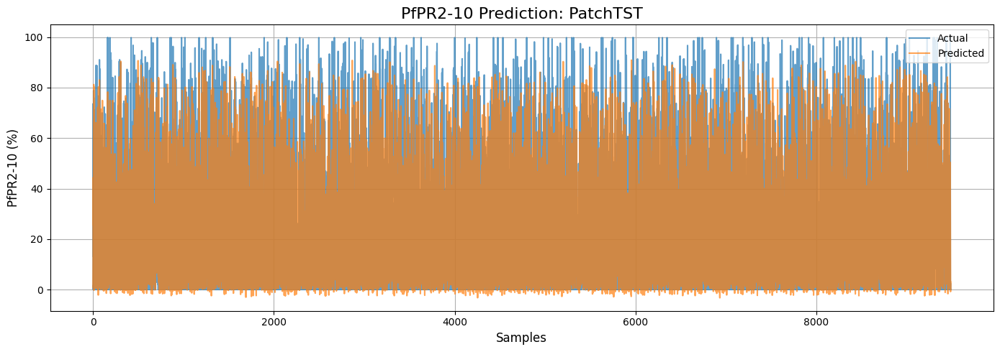

In [11]:
plt.figure(figsize=(14, 5))
plt.plot(actuals, label='Actual', alpha=0.7)
plt.plot(preds, label='Predicted', alpha=0.7)
plt.title("PfPR2-10 Prediction: PatchTST", fontsize=16)
plt.xlabel("Samples", fontsize=12)
plt.ylabel("PfPR2-10 (%)", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


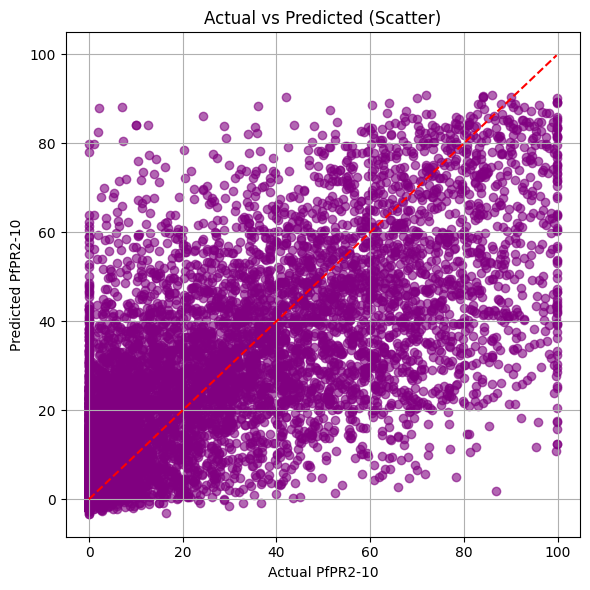

In [12]:
plt.figure(figsize=(6, 6))
plt.scatter(actuals, preds, alpha=0.6, c='purple')
plt.plot([min(actuals), max(actuals)], [min(actuals), max(actuals)], 'r--')
plt.xlabel("Actual PfPR2-10")
plt.ylabel("Predicted PfPR2-10")
plt.title("Actual vs Predicted (Scatter)")
plt.grid(True)
plt.tight_layout()
plt.show()


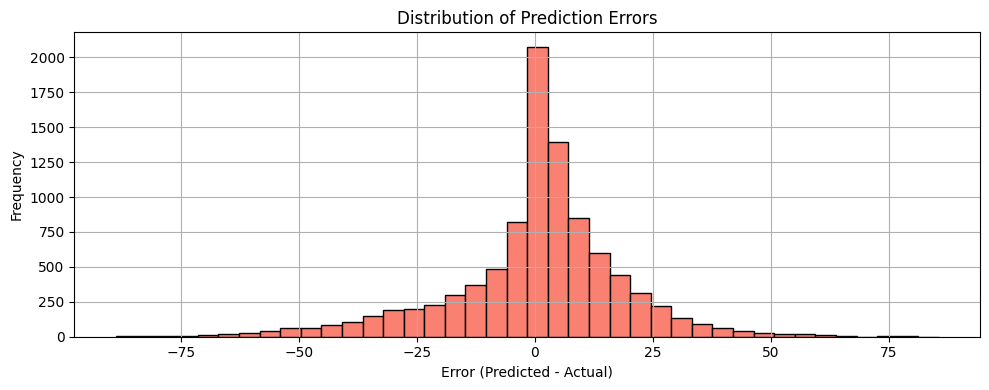

In [13]:
errors = preds - actuals
plt.figure(figsize=(10, 4))
plt.hist(errors, bins=40, color='salmon', edgecolor='black')
plt.title("Distribution of Prediction Errors")
plt.xlabel("Error (Predicted - Actual)")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


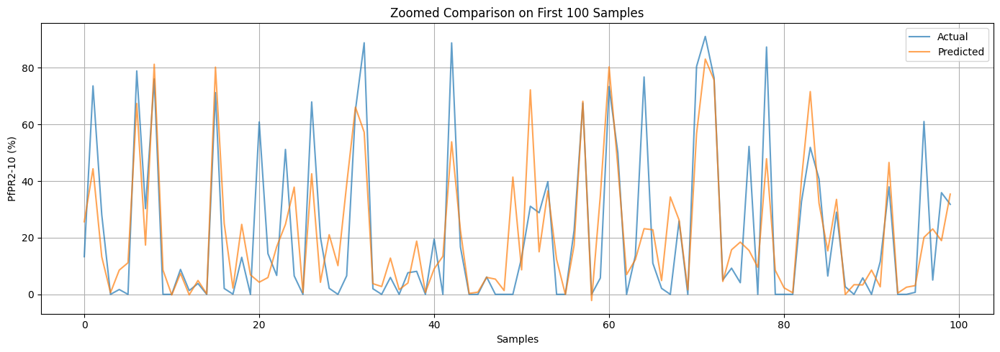

In [14]:
window = 100  # change to zoom on other ranges
plt.figure(figsize=(14, 5))
plt.plot(actuals[:window], label='Actual', alpha=0.7)
plt.plot(preds[:window], label='Predicted', alpha=0.7)
plt.title(f"Zoomed Comparison on First {window} Samples")
plt.xlabel("Samples")
plt.ylabel("PfPR2-10 (%)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


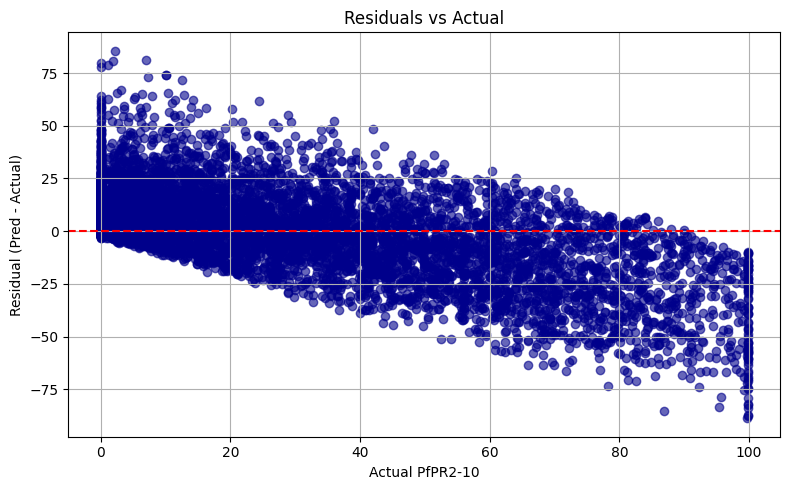

In [15]:
residuals = preds - actuals
plt.figure(figsize=(8, 5))
plt.scatter(actuals, residuals, alpha=0.6, c='darkblue')
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals vs Actual")
plt.xlabel("Actual PfPR2-10")
plt.ylabel("Residual (Pred - Actual)")
plt.grid(True)
plt.tight_layout()
plt.show()


# rate of malaria prediction with PatchTST incorporating Uncertainty estimation with Monte-Carlo Dropout

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


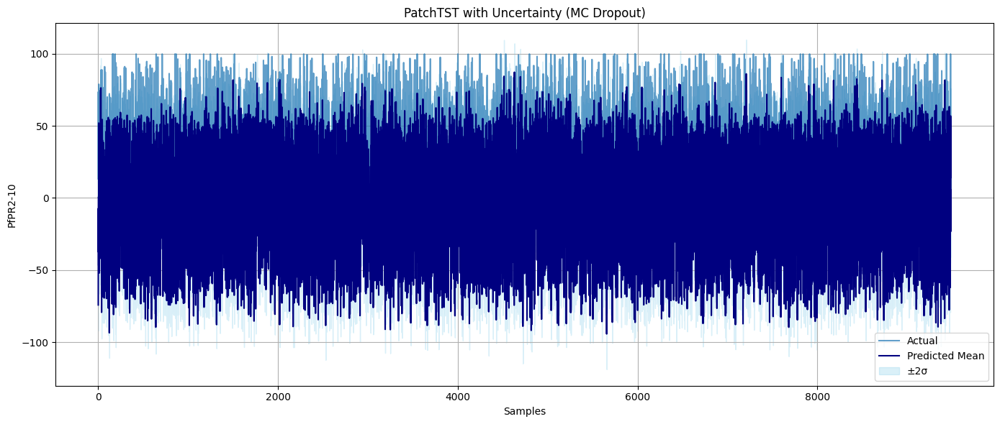

In [1]:
# ======================= UNCERTAINTY-AWARE PATCHTST (MC DROPOUT) =======================

import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

# ======================= 1. Load & Preprocess =======================
df = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")
df = df.dropna(subset=['PfPR2-10'])

for col in ['AREA_TYPE', 'METHOD', 'COUNTRY']:
    if col in df.columns:
        le = LabelEncoder()
        df[col + '_encoded'] = le.fit_transform(df[col].astype(str))

# Fix datetime
df['Date'] = pd.to_datetime(df[['YY', 'MM']].rename(columns={'YY': 'year', 'MM': 'month'}).assign(day=1))
df = df.sort_values(by=['COUNTRY', 'AFR ADMIN2 Code', 'Date'])

# ======================= 2. Dataset =======================
class ImprovedMalariaDataset(Dataset):
    def __init__(self, data, sequence_length=6, target_col='PfPR2-10', scaler=None, is_training=True):
        self.data = data.copy()
        self.sequence_length = sequence_length
        self.target_col = target_col
        self.is_training = is_training
        self.data['location_id'] = self.data['COUNTRY'] + '_' + self.data['AFR ADMIN2 Code'].astype(str)
        self.locations = self.data['location_id'].unique()

        if scaler is None:
            self.temporal_scaler = StandardScaler()
            self.spatial_scaler = StandardScaler()
            self.target_scaler = MinMaxScaler()
        else:
            self.temporal_scaler, self.spatial_scaler, self.target_scaler = scaler

        self.features, self.targets, self.spatial_features = self._prepare_data()

    def _prepare_data(self):
        features_list, targets_list, spatial_features_list = [], [], []
        all_temporal_data, all_spatial_data, all_targets = [], [], []

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = loc_data[temporal_cols].values
            all_temporal_data.extend(temporal_data)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = loc_data[spatial_cols].iloc[0].values
            all_spatial_data.append(spatial_data)

            targets = loc_data[self.target_col].values
            all_targets.extend(targets)

        if self.is_training:
            self.temporal_scaler.fit(all_temporal_data)
            self.spatial_scaler.fit(all_spatial_data)
            self.target_scaler.fit(np.array(all_targets).reshape(-1, 1))

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temp_data = self.temporal_scaler.transform(loc_data[temporal_cols].values)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = self.spatial_scaler.transform(loc_data[spatial_cols].iloc[0].values.reshape(1, -1))[0]

            for i in range(len(loc_data) - self.sequence_length):
                seq_features = temp_data[i:i + self.sequence_length]
                features_list.append(seq_features)
                target = loc_data[self.target_col].iloc[i + self.sequence_length]
                scaled_target = self.target_scaler.transform([[target]])[0][0]
                targets_list.append(scaled_target)
                spatial_features_list.append(spatial_data)

        return (np.array(features_list), np.array(targets_list), np.array(spatial_features_list))

    def get_scalers(self):
        return self.temporal_scaler, self.spatial_scaler, self.target_scaler

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return (torch.FloatTensor(self.features[idx]),
                torch.FloatTensor(self.spatial_features[idx]),
                torch.FloatTensor([self.targets[idx]]))

# ======================= 3. PatchTST With Dropout =======================
class PatchTSTWithSpatial(nn.Module):
    def __init__(self, input_dim, spatial_dim, patch_len=2, d_model=64, n_heads=4, num_layers=2, dropout=0.2):
        super(PatchTSTWithSpatial, self).__init__()
        self.patch_len = patch_len
        self.d_model = d_model

        self.patch_embedding = nn.Linear(patch_len * input_dim, d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=n_heads, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.spatial_mlp = nn.Sequential(
            nn.Linear(spatial_dim, d_model),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, d_model)
        )
        self.fc_out = nn.Linear(d_model * 2, 1)

    def forward(self, x_temporal, x_spatial):
        B, T, F = x_temporal.size()
        num_patches = T // self.patch_len
        x = x_temporal[:, :num_patches * self.patch_len, :].reshape(B, num_patches, -1)
        x = self.patch_embedding(x).permute(1, 0, 2)
        x = self.transformer_encoder(x).mean(dim=0)
        x_spatial_out = self.spatial_mlp(x_spatial)
        return self.fc_out(torch.cat([x, x_spatial_out], dim=1)).squeeze(1)

    def enable_mc_dropout(self):
        for m in self.modules():
            if isinstance(m, nn.Dropout):
                m.train()

# ======================= 4. MC Dropout Inference =======================
def predict_with_uncertainty(model, dataset, scaler, mc_passes=30, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()
    model.enable_mc_dropout()

    loader = DataLoader(dataset, batch_size=1)
    all_preds, actuals = [], []

    with torch.no_grad():
        for x_temporal, x_spatial, y in loader:
            x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device)
            mc_preds = [model(x_temporal, x_spatial).cpu().numpy() for _ in range(mc_passes)]
            mc_preds = np.array(mc_preds).reshape(mc_passes, -1)
            all_preds.append((mc_preds.mean(axis=0), mc_preds.std(axis=0)))
            actuals.append(y.cpu().numpy())

    means = np.array([m[0] for m in all_preds]).flatten()
    stds = np.array([m[1] for m in all_preds]).flatten()
    actuals = np.array(actuals).flatten()

    means = scaler.inverse_transform(means.reshape(-1, 1)).flatten()
    stds = stds * (scaler.data_max_ - scaler.data_min_)
    actuals = scaler.inverse_transform(actuals.reshape(-1, 1)).flatten()

    x = np.arange(len(means))
    plt.figure(figsize=(14, 6))
    plt.plot(x, actuals, label='Actual', alpha=0.7)
    plt.plot(x, means, label='Predicted Mean', color='navy')
    plt.fill_between(x, means - 2*stds, means + 2*stds, color='skyblue', alpha=0.3, label='±2σ')
    plt.title("PatchTST with Uncertainty (MC Dropout)")
    plt.xlabel("Samples")
    plt.ylabel("PfPR2-10")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return means, stds, actuals

# ======================= 5. Train & Run =======================
dataset = ImprovedMalariaDataset(df, sequence_length=6, is_training=True)
scalers = dataset.get_scalers()
train_idx, val_idx = train_test_split(np.arange(len(dataset)), test_size=0.2, random_state=42)
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)

input_dim = train_dataset[0][0].shape[1]
spatial_dim = train_dataset[0][1].shape[0]
model = PatchTSTWithSpatial(input_dim, spatial_dim)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Optional training (insert your train loop here) or load pretrained weights
model = model.to(device)

# Run MC Dropout inference
means, stds, actuals = predict_with_uncertainty(model, val_dataset, dataset.target_scaler)


# PatchTST Complete pipeline

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch 01 | Train Loss: 0.0482 | Val Loss: 0.0374
Epoch 02 | Train Loss: 0.0373 | Val Loss: 0.0363
Epoch 03 | Train Loss: 0.0358 | Val Loss: 0.0354
Epoch 04 | Train Loss: 0.0353 | Val Loss: 0.0348
Epoch 05 | Train Loss: 0.0347 | Val Loss: 0.0361
Epoch 06 | Train Loss: 0.0345 | Val Loss: 0.0348
Epoch 07 | Train Loss: 0.0340 | Val Loss: 0.0352
Epoch 08 | Train Loss: 0.0339 | Val Loss: 0.0344
Epoch 09 | Train Loss: 0.0338 | Val Loss: 0.0349
Epoch 10 | Train Loss: 0.0334 | Val Loss: 0.0341
Epoch 11 | Train Loss: 0.0331 | Val Loss: 0.0340
Epoch 12 | Train Loss: 0.0333 | Val Loss: 0.0344
Epoch 13 | Train Loss: 0.0330 | Val Loss: 0.0356
Epoch 14 | Train Loss: 0.0328 | Val Loss: 0.0350
Epoch 15 | Train Loss: 0.0328 | Val Loss: 0.0375
Epoch 16 | Train Loss: 0.0326 | Val Loss: 0.0332
Epoch 17 | Train Loss: 0.0327 | Val Loss: 0.0356
Epoch 18 | Train Loss: 0.0324 | Val Loss: 0.0339
Epoch 19 | Train Loss: 0.0322 | Val Loss: 0.0349
Epoch 20 | Train Loss: 0.0323 | Val Loss: 0.0343
Epoch 21 | Train Los

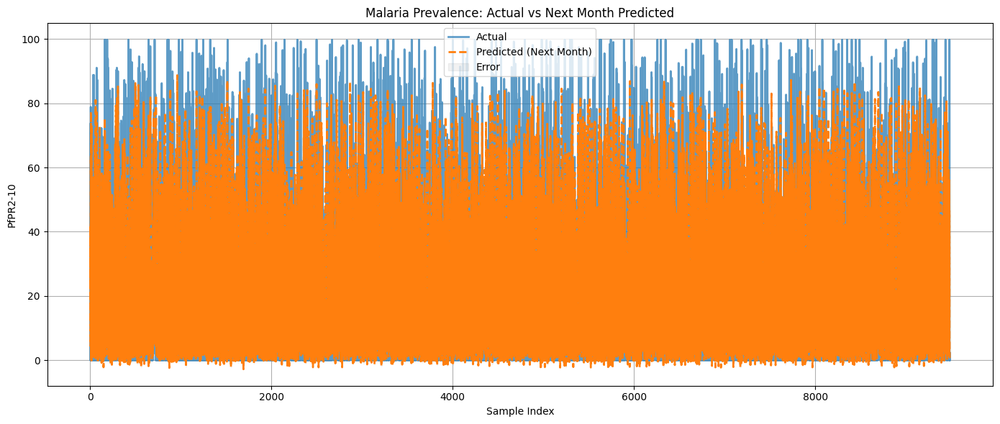

In [3]:
# ======================= INSTALL DEPENDENCIES =======================
# pip install pandas numpy scikit-learn torch matplotlib

# ======================= IMPORTS =======================
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score

# ======================= STEP 1: Load CSV =======================
df = pd.read_csv("/kaggle/input/malaria-data-ea/00 Africa 1900-2015 SSA PR database (260617).csv")

# Drop missing targets
df = df.dropna(subset=['PfPR2-10'])

# Encode categorical features
for col in ['AREA_TYPE', 'METHOD', 'COUNTRY']:
    if col in df.columns:
        le = LabelEncoder()
        df[col + '_encoded'] = le.fit_transform(df[col].astype(str))

# Create datetime and sort
# Fix for datetime parsing
df['Date'] = pd.to_datetime(df[['YY', 'MM']].rename(columns={'YY': 'year', 'MM': 'month'}).assign(day=1))
df = df.sort_values(by=['COUNTRY', 'AFR ADMIN2 Code', 'Date'])

# ======================= STEP 2: Dataset Class =======================
class ImprovedMalariaDataset(Dataset):
    def __init__(self, data, sequence_length=6, target_col='PfPR2-10', scaler=None, is_training=True):
        self.data = data.copy()
        self.sequence_length = sequence_length
        self.target_col = target_col
        self.is_training = is_training
        
        self.data['location_id'] = self.data['COUNTRY'] + '_' + self.data['AFR ADMIN2 Code'].astype(str)
        self.locations = self.data['location_id'].unique()
        
        if scaler is None:
            self.temporal_scaler = StandardScaler()
            self.spatial_scaler = StandardScaler()
            self.target_scaler = MinMaxScaler()
        else:
            self.temporal_scaler, self.spatial_scaler, self.target_scaler = scaler

        self.features, self.targets, self.spatial_features = self._prepare_data()

    def _prepare_data(self):
        features_list, targets_list, spatial_features_list = [], [], []
        all_temporal_data, all_spatial_data, all_targets = [], [], []

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temporal_data = loc_data[temporal_cols].values
            all_temporal_data.extend(temporal_data)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = loc_data[spatial_cols].iloc[0].values
            all_spatial_data.append(spatial_data)

            targets = loc_data[self.target_col].values
            all_targets.extend(targets)

        if self.is_training:
            self.temporal_scaler.fit(all_temporal_data)
            self.spatial_scaler.fit(all_spatial_data)
            self.target_scaler.fit(np.array(all_targets).reshape(-1, 1))

        for location in self.locations:
            loc_data = self.data[self.data['location_id'] == location].copy()
            loc_data = loc_data.sort_values(['YY', 'MM'])
            if len(loc_data) < self.sequence_length + 1:
                continue

            temporal_cols = ['MM', 'YY', 'LoAge', 'UpAge', 'Ex', 'Pf']
            temp_data = self.temporal_scaler.transform(loc_data[temporal_cols].values)

            spatial_cols = ['Lat', 'Long']
            for c in ['AREA_TYPE_encoded', 'METHOD_encoded', 'COUNTRY_encoded']:
                if c in loc_data.columns:
                    spatial_cols.append(c)
            spatial_data = self.spatial_scaler.transform(
                loc_data[spatial_cols].iloc[0].values.reshape(1, -1)
            )[0]

            for i in range(len(loc_data) - self.sequence_length):
                seq_features = temp_data[i:i + self.sequence_length]
                features_list.append(seq_features)
                target = loc_data[self.target_col].iloc[i + self.sequence_length]
                scaled_target = self.target_scaler.transform([[target]])[0][0]
                targets_list.append(scaled_target)
                spatial_features_list.append(spatial_data)

        return (np.array(features_list), 
                np.array(targets_list), 
                np.array(spatial_features_list))

    def get_scalers(self):
        return self.temporal_scaler, self.spatial_scaler, self.target_scaler

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return (torch.FloatTensor(self.features[idx]),
                torch.FloatTensor(self.spatial_features[idx]),
                torch.FloatTensor([self.targets[idx]]))

# ======================= STEP 3: PatchTST Model =======================
class PatchTSTWithSpatial(nn.Module):
    def __init__(self, input_dim, spatial_dim, patch_len=2, d_model=64, n_heads=4, num_layers=2, dropout=0.1):
        super(PatchTSTWithSpatial, self).__init__()
        self.patch_len = patch_len
        self.d_model = d_model

        self.patch_embedding = nn.Linear(patch_len * input_dim, d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=n_heads, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.spatial_mlp = nn.Sequential(
            nn.Linear(spatial_dim, d_model),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, d_model)
        )
        self.fc_out = nn.Linear(d_model * 2, 1)

    def forward(self, x_temporal, x_spatial):
        B, T, F = x_temporal.size()
        num_patches = T // self.patch_len
        x = x_temporal[:, :num_patches * self.patch_len, :]
        x = x.reshape(B, num_patches, -1)
        x = self.patch_embedding(x)
        x = x.permute(1, 0, 2)
        x = self.transformer_encoder(x)
        x_temporal_out = x.mean(dim=0)
        x_spatial_out = self.spatial_mlp(x_spatial)
        fused = torch.cat([x_temporal_out, x_spatial_out], dim=1)
        return self.fc_out(fused).squeeze(1)

# ======================= STEP 4: Training =======================
def train_model(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for x_temporal, x_spatial, y in dataloader:
        x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
        optimizer.zero_grad()
        out = model(x_temporal, x_spatial)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for x_temporal, x_spatial, y in dataloader:
            x_temporal, x_spatial, y = x_temporal.to(device), x_spatial.to(device), y.to(device).squeeze(1)
            out = model(x_temporal, x_spatial)
            loss = criterion(out, y)
            total_loss += loss.item() * len(y)
    return total_loss / len(dataloader.dataset)

def run_pipeline(train_dataset, val_dataset, patch_len=2, epochs=20, batch_size=32, lr=1e-3):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_dim = train_dataset[0][0].shape[1]
    spatial_dim = train_dataset[0][1].shape[0]

    model = PatchTSTWithSpatial(input_dim, spatial_dim, patch_len).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    for epoch in range(epochs):
        train_loss = train_model(model, train_loader, optimizer, criterion, device)
        val_loss = evaluate_model(model, val_loader, criterion, device)
        print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    return model

# ======================= STEP 5: Predict & Plot =======================
def predict(model, dataset, scaler, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    loader = DataLoader(dataset, batch_size=1)
    predictions, actuals = [], []

    with torch.no_grad():
        for x_temporal, x_spatial, y in loader:
            x_temporal = x_temporal.to(device)
            x_spatial = x_spatial.to(device)
            y = y.to(device)

            pred = model(x_temporal, x_spatial).cpu().numpy()
            predictions.append(pred)
            actuals.append(y.cpu().numpy())

    # Inverse transform
    predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
    actuals = scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

    print(f"MAE: {mean_absolute_error(actuals, predictions):.2f}, R²: {r2_score(actuals, predictions):.2f}")

    # Create time indices
    x = np.arange(len(actuals))

    # Plot actual vs predicted
    plt.figure(figsize=(14, 6))
    plt.plot(x, actuals, label='Actual', linewidth=2, alpha=0.7)
    plt.plot(x, predictions, label='Predicted (Next Month)', linestyle='--', linewidth=2)
    plt.fill_between(x, predictions, actuals, color='gray', alpha=0.1, label='Error')
    plt.xlabel("Sample Index")
    plt.ylabel("PfPR2-10")
    plt.title("Malaria Prevalence: Actual vs Next Month Predicted")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return predictions, actuals

# ======================= STEP 6: Run Everything =======================
dataset = ImprovedMalariaDataset(df, sequence_length=6, is_training=True)
scalers = dataset.get_scalers()

indices = np.arange(len(dataset))
train_idx, val_idx = train_test_split(indices, test_size=0.2, random_state=42)
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)

model = run_pipeline(train_dataset, val_dataset, patch_len=2, epochs=30)
preds, actuals = predict(model, val_dataset, dataset.target_scaler)
